# World Data League 2022

## 🎯 Challenge
***Finals:*** Identification of Dark Ecological Corridors

## Team: YODAS

## 👥 Authors

*   Cristiana Carpinteiro
*   Diogo Polónia
*   João Matos
*   João Pereira
*   Patrícia Rocha

## 📋 Table of Contents<a name="top"></a>

[Setup](#setup)

[Development](#dev)

1. [EDA](#eda)
2. [Create Optimization Grid](#grid)
3. [Feature Extraction](#feature)
4. [Create Final Scores](#score)
5. [Predator - Prey Analysis](#population)
6. [Optimization for Light System with Dark Corridors](#light)
7. [Light Management System in Action](#action)
8. [Impact Estimation](#impact)

## ⚙️ ***Setup*** <a name="setup"></a>

Install and import required libraries:

In [ ]:
# Uncomment to install required libraries
# !pip3 install Dijkstar
# !pip3 install geopandas
# !pip3 install geoplot
# !pip3 install h3
# !pip3 install libpysal
# !pip3 install shapely
# !pip3 install tobler

In [ ]:
import ast
import dijkstar as dj
import geopandas as gpd
import libpysal
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import scipy
import seaborn as sns
import warnings
import ipywidgets as ipw
import scipy.optimize
import string

from datetime import datetime as dt
from google.colab import drive
from IPython.display import HTML
from matplotlib import rcParams, animation
from scipy.cluster import vq
from shapely import wkt
from shapely.geometry import Polygon, GeometryCollection, Point, LineString, shape
from shapely.ops import cascaded_union
from sklearn import preprocessing, cluster
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from time import time
from tobler.area_weighted import area_interpolate
from tobler.util import h3fy
from scipy import integrate
from scipy.integrate import odeint
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree

warnings.filterwarnings(action='ignore')

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string
/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Setup google drive:

In [ ]:
drive.mount('/content/drive/')
os.chdir('/content/drive/MyDrive/Finals/Data')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Customize properties and styles of Matplotlib:

In [ ]:
rcParams['figure.figsize'] = 32, 16
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['lines.linewidth'] = 2.

## 💻 Development <a name="dev"></a>

***Artificial Light at Night*** (ALAN) is a global phenomenon that poses a major threat to biodiversity, especially ***bats and other nocturnal animals***.
In 2020, Bristol was the first city in the UK to announce an ecological emergency in response to the decline in wildlife. Now, they challenged us to create an **optimization algorithm that connects all habitats through dark corridors**, thus mitigating the impacts of ALAN on bat activity and movement.

### ***1. EDA*** <a name="eda"></a>

In this section, we started by exploring all datasets provided by the WDL organization, as well as some other resources that we found in Open Data Bristol.

***Plot streetlights in Bristol:***

In [ ]:
bristol_map = gpd.read_file('https://martinjc.github.io/UK-GeoJSON/json/eng/wpc_by_lad/topo_E06000023.json')
bristol_map = bristol_map.set_crs('EPSG:4326').to_crs('EPSG:27700')
minx, miny, maxx, maxy = bristol_map.total_bounds

In [ ]:
streetlights_2022 = pd.read_csv('streetlights_2022.csv')
streetlights_2022 = streetlights_2022.drop_duplicates(subset=['Easting', 'Northing'], keep='last')

# Convert from dataframe to geodataframe
streetlights_2022['geometry'] = streetlights_2022['geometry'].apply(wkt.loads)
streetlights_2022_gdf = gpd.GeoDataFrame(streetlights_2022, crs='EPSG:27700')

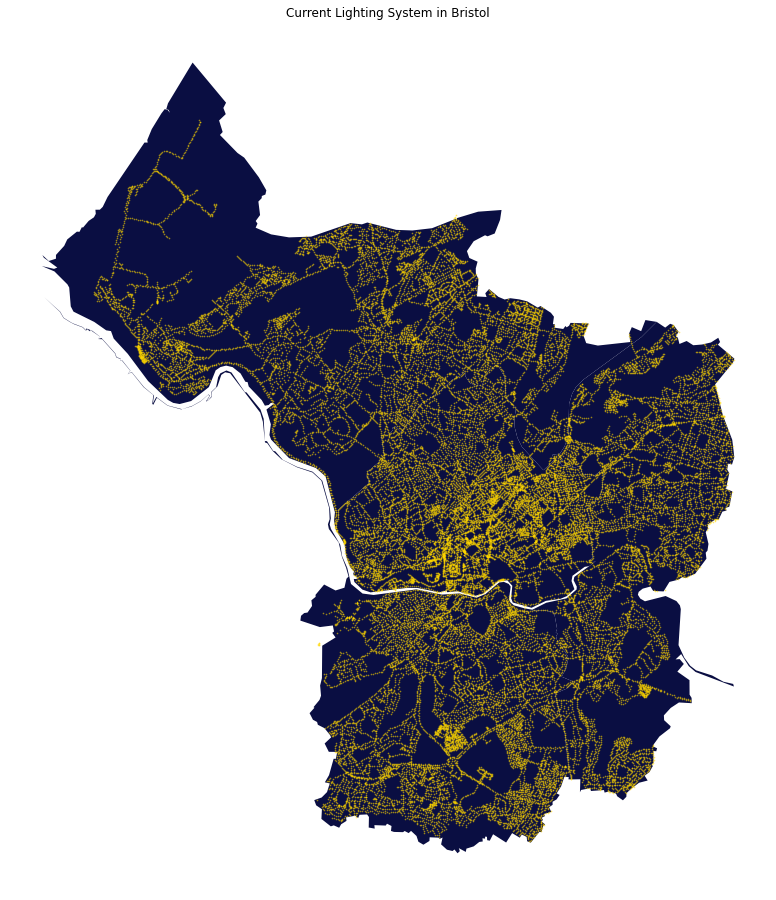

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='#0A0E42', ax=ax)
streetlights_2022_gdf.plot(markersize=0.5, ax=ax, color='gold', alpha=0.5)
ax.set_title('Current Lighting System in Bristol')
ax.set_axis_off()

#### ***1.1 Curate bat sightings dataset***

Most of these bats are small bats, with a body of up to 7cm. However, *Noctua pronuba* is a big moth, with 6cm in average. Though this species of moth might not be the actual prey of these small bats, we will consider both the bats and moths as a proxy to the locations where bats and moths tend to be. 

In [ ]:
bat_records = pd.read_csv('bat_records.csv')

***Convert Abundance to Quantity:***

Since the abundance column contains some subjective terms used by the recorder, we made the following assumptions.

In [ ]:
bat_records['quantity'] = bat_records['ABUNDANCE']

bat_records.loc[bat_records['ABUNDANCE'] == 'present', 'quantity'] = 5
bat_records.loc[bat_records['ABUNDANCE'] == 'Present', 'quantity'] = 5
bat_records.loc[bat_records['ABUNDANCE'] == '1+', 'quantity'] = 3
bat_records.loc[bat_records['ABUNDANCE'] == '2-3', 'quantity'] = 3
bat_records.loc[bat_records['ABUNDANCE'] == '2+', 'quantity'] = 4
bat_records.loc[bat_records['ABUNDANCE'] == '10 approx', 'quantity'] = 3
bat_records.loc[bat_records['ABUNDANCE'] == 'few', 'quantity'] = 3
bat_records.loc[bat_records['ABUNDANCE'] == 'several', 'quantity'] = 25
bat_records.loc[bat_records['ABUNDANCE'] == 'abundant', 'quantity'] = 25
bat_records.loc[bat_records['ABUNDANCE'] == 'many', 'quantity'] = 25
bat_records.loc[bat_records['ABUNDANCE'] == 'Many', 'quantity'] = 25

bat_records.drop(bat_records[bat_records['ABUNDANCE'] == 'none'].index, inplace=True)

bat_records.quantity = bat_records.quantity.astype('int32')

***Protected Species:***

Depending on the BRERC STAT, we should assign a different weight to each bat:
*   Widespread = 1
*   Local/Rare = 2
*   Protected/Stronghold/Important = 3

In [ ]:
bat_records.loc[bat_records['BRERC_STAT'] == 'Proposed BRERC Notable 2004 as protected', 'protected_weight'] = 3
bat_records.loc[bat_records['BRERC_STAT'] == 'Local - Avon is a national stronghold', 'protected_weight'] = 3
bat_records.loc[bat_records['BRERC_STAT'] == 'Local - some nationally important roosts', 'protected_weight'] = 3
bat_records.loc[bat_records['BRERC_STAT'] == 'Rare - Bristol is a national stronghold', 'protected_weight'] = 3
bat_records.loc[bat_records['BRERC_STAT'] == 'Proposed BRERC Notable 2007 as protected', 'protected_weight'] = 3
bat_records.loc[bat_records['BRERC_STAT'] == 'Proposed BRERC Notable 2020', 'protected_weight'] = 3

bat_records.loc[bat_records['BRERC_STAT'] == 'Rare', 'protected_weight'] = 2
bat_records.loc[bat_records['BRERC_STAT'] == 'Local', 'protected_weight'] = 2
bat_records.loc[bat_records['BRERC_STAT'] == 'Local or Rare', 'protected_weight'] = 2

bat_records.loc[bat_records['BRERC_STAT'] == 'Widespread', 'protected_weight'] = 1
bat_records.loc[bat_records['BRERC_STAT'] == 'No recent records', 'protected_weight'] = 1

In [ ]:
# Convert to GeoDataFrame
bat_records_gdf = gpd.GeoDataFrame(bat_records, geometry=gpd.points_from_xy(bat_records.EASTING, bat_records.NORTHING))
bat_records_gdf = bat_records_gdf[bat_records_gdf.YEAR_DATE >= 1990]

***Sex Stage:***

In [ ]:
bat_records_gdf.SEX_STAGE.replace(
  {'Present': 'present', 'adult female': 'adult', 'adult male': 'adult',
   'Adult male': 'adult', 'Adult female': 'adult', 'Adult': 'adult',
   'Male': 'male', 'Female': 'female', 'juvenile male': 'young',
   'juvenile': 'young', 'immature or juvenile': 'young',
   'juvenile female': 'young', 'immature': 'young', 'Immature Female': 'young',
   'breeding (sensitive record)': 'breeding', 'dead male': 'dead', 
   'dead female': 'dead', 'dead adult': 'dead'
  }, inplace=True)

The number of specific bat sightings behaviours, such as breeding or feeding are limited. However, from the information available, young bats seem to be located farther from the city center, indicating that most probably there are colonies nearby. Hibernating sightings are outside the city boundaries.

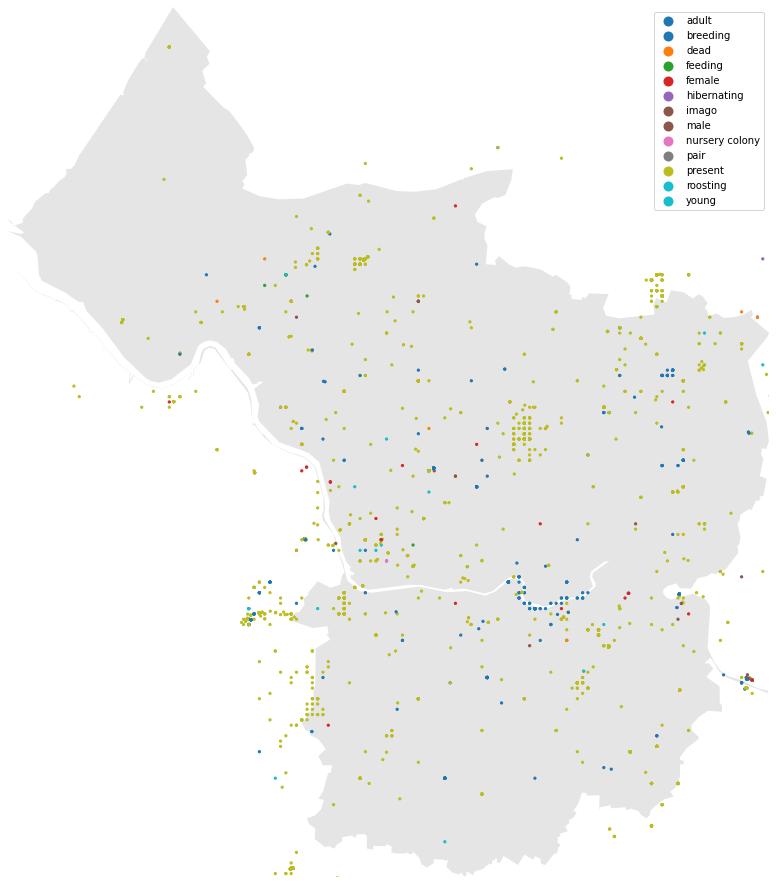

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
bat_records_gdf.plot(column= 'SEX_STAGE', ax=ax, legend=True, markersize=5)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_axis_off()

#### ***1.2 Curate moth sightings dataset***

In [ ]:
moth_records = pd.read_csv('noctua_pronuba_xy.csv')

In [ ]:
moth_records['quantity'] = moth_records['Abundance']

moth_records.loc[moth_records['Abundance'] == 'present', 'quantity'] = 5
moth_records.loc[moth_records['Abundance'] == 'Present', 'quantity'] = 5
moth_records.loc[moth_records['Abundance'] == 'abundant', 'quantity'] = 25

moth_records.quantity = moth_records.quantity.astype('int32')

In [ ]:
# Convert to GeoDataFrame
moth_records_gdf = gpd.GeoDataFrame(moth_records, geometry=gpd.points_from_xy(moth_records.X, moth_records.Y))
moth_records_gdf = moth_records_gdf[moth_records_gdf.Year_Date >= 1990]

#### ***1.3 Clustering to find high bat activity locations***

In this section, we performed clustering on the bat sightings dataset in order to find the location of high bat activity places. We will then use these clusters to find the optimal dark corridors that allow bats to move freely between them.

First, we used the ***Elbow method*** to approximate the number of clusters:

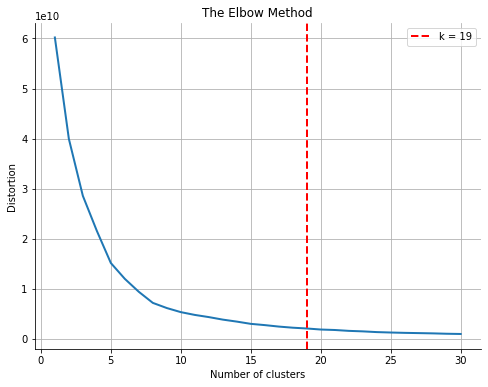

In [ ]:
X = bat_records_gdf[['EASTING','NORTHING']]
max_k = 30

distortions = [] 
for i in range(1, max_k + 1):
  if len(X) >= i:
    model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=5)
    model.fit(X)
    distortions.append(model.inertia_)

# Best K: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i  in np.diff(distortions,2)]))

fig, ax = plt.subplots(figsize=(8,6))
ax.plot(range(1, len(distortions) + 1), distortions)
ax.axvline(k, ls='--', color='red', label='k = ' + str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', ylabel='Distortion')
ax.legend()
ax.grid(True)
plt.show()

In [ ]:
model = cluster.KMeans(n_clusters=k, init='k-means++')

dtf_X = X.copy()
dtf_X['cluster'] = model.fit_predict(X, sample_weight=bat_records_gdf.quantity.values)

# Find real centroids
closest, distances = vq.vq(model.cluster_centers_, dtf_X.drop('cluster', axis=1).values)

dtf_X['centroids'] = 0
for i in closest:
    dtf_X['centroids'].iloc[i] = 1
    
# Add clustering information to the original dataset
bat_records_gdf[['cluster','centroids']] = dtf_X[['cluster','centroids']]

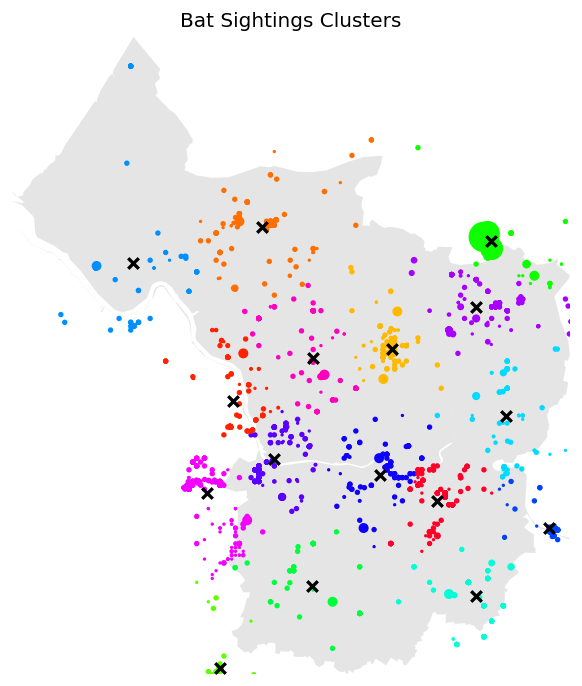

In [ ]:
df_centroids = pd.DataFrame(data=model.cluster_centers_, columns=['EASTING' , 'NORTHING'])
df_centroids['quantity'] = bat_records_gdf.groupby(by='cluster').sum()['quantity']
gpd_centroids = gpd.GeoDataFrame(df_centroids, geometry=gpd.points_from_xy(df_centroids.EASTING, df_centroids.NORTHING))

fig, ax = plt.subplots(figsize=(6,10),dpi=120)
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
bat_records_gdf.plot(column='cluster', ax=ax, legend=False, markersize='quantity', cmap='gist_rainbow')
gpd_centroids.plot(ax=ax, legend=False, markersize=40, marker='x', color='black')
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_title('Bat Sightings Clusters')
ax.set_axis_off()

#### ***1.4 Explore bat-oriented features***

Here we explored some geographical factors that are relevant for bat activity. For instance, current wildlife corridors or habitat corridors are areas connecting wildlife populations:

In [ ]:
wildlife_corridors = pd.read_csv('wildlife_corridors.csv')

# Convert from dataframe to geodataframe
wildlife_corridors['geometry'] = wildlife_corridors['geometry'].apply(wkt.loads)
wildlife_corridors = gpd.GeoDataFrame(wildlife_corridors, crs='EPSG:27700')

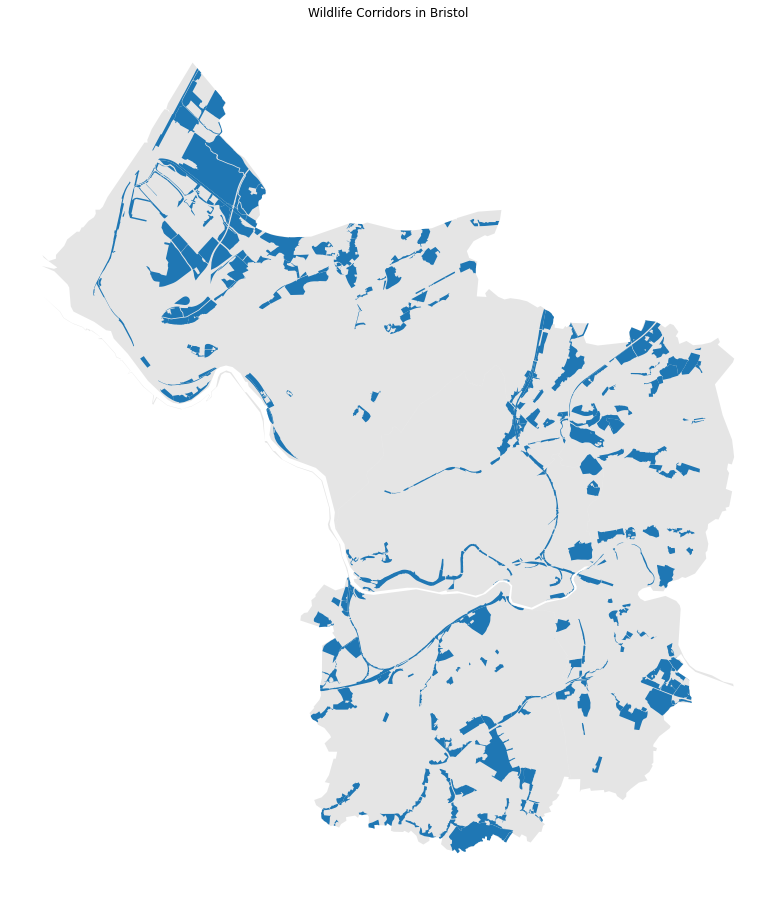

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
wildlife_corridors.plot(ax=ax)
ax.set_title('Wildlife Corridors in Bristol')
ax.set_axis_off()

Trees such as oak, beech and ash gather the perfect conditions for bats such as cavities in the trunk or branches, woodpecker holes, loose bark, cracks, splits, and thick ivy, as cited [here](https://www.bats.org.uk/about-bats/where-do-bats-live/bat-roosts/roosts-in-trees):

In [ ]:
green_alley_species = pd.read_csv('green_alley_species_xy.csv')
green_alley_species = green_alley_species[green_alley_species.Common_Name.str.contains('Oak|oak|Beech|Ash')]
green_alley_species_gdf = gpd.GeoDataFrame(green_alley_species, geometry=gpd.points_from_xy(green_alley_species.X, green_alley_species.Y))

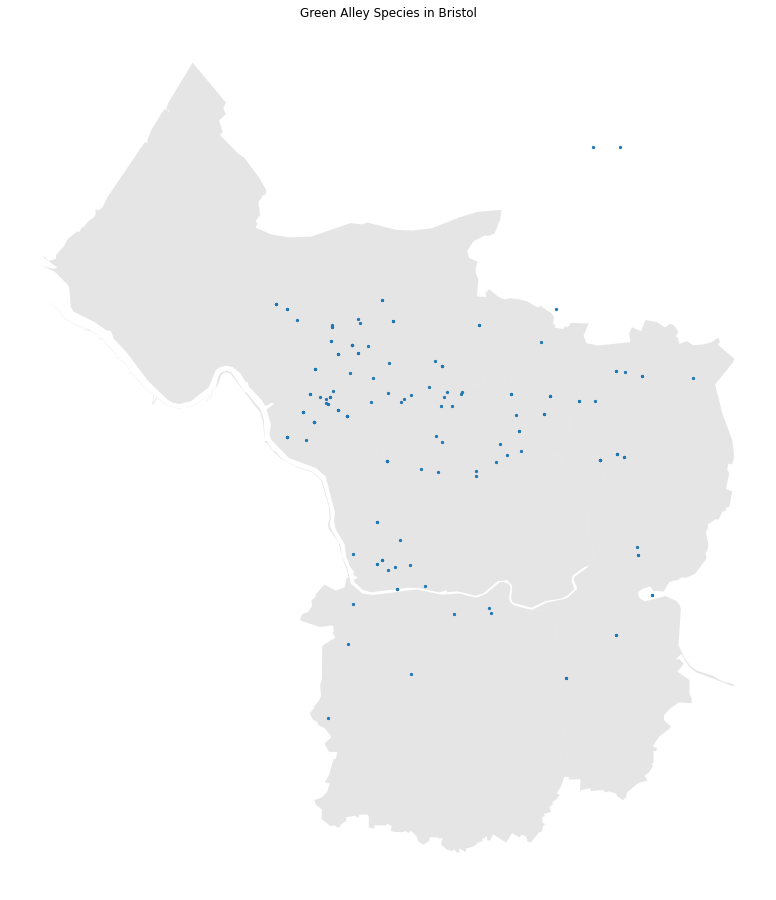

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
green_alley_species_gdf.plot(ax=ax, markersize=5)
ax.set_title('Green Alley Species in Bristol')
ax.set_axis_off()

Watercourses are largely used by bats to navigate between different areas (they benefit from linear features such as hedgerows or watercourses), as well as being sources of insects for foraging:

In [ ]:
water_bodies = pd.read_csv('surface-water-sampling-points.csv', sep=';')
water_bodies_gdf = gpd.GeoDataFrame(water_bodies, geometry=gpd.points_from_xy(water_bodies.Easting, water_bodies.Northing))

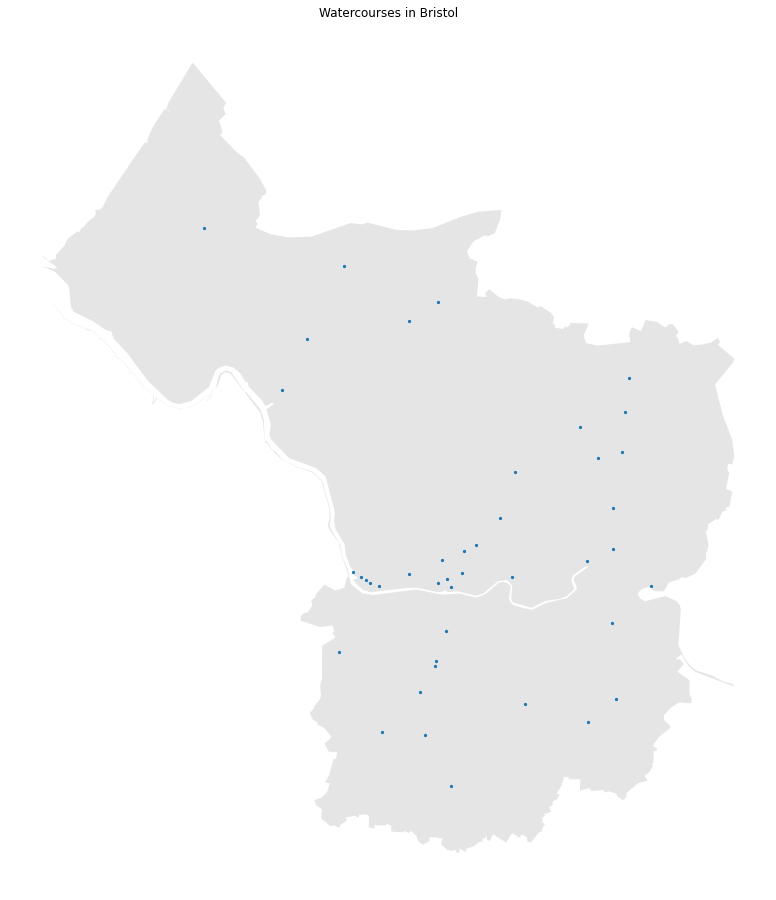

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
water_bodies_gdf.plot(ax=ax, markersize=5)
ax.set_title('Watercourses in Bristol')
ax.set_axis_off()

#### ***1.5 Explore human-oriented features***

To take into account the safety of pedestrians, we also explored some human-oriented features to make sure we do not turn off the lights in areas with a high flow of people, for instance. 

***Flow Counts:***

Since bats hibernate and are only active during the night, we will only consider the following period: [March-November, 7pm-7am](https://www.timeanddate.com/sun/uk/bristol).

In [ ]:
fact_traffic_counts = pd.read_csv('fact-traffic-counts.csv', delimiter=';')
fact_traffic_counts = fact_traffic_counts[fact_traffic_counts['geo_point_2d'].notnull()]
fact_traffic_counts = fact_traffic_counts[fact_traffic_counts['Hourly Flow'] != 0]

fact_traffic_counts['Date Time'] = pd.to_datetime(fact_traffic_counts['Date Time'])
fact_traffic_counts['month'] = fact_traffic_counts['Date Time'].apply(lambda x: x.month)
fact_traffic_counts['hour'] = fact_traffic_counts['Date Time'].apply(lambda x: x.hour)

fact_traffic_counts = fact_traffic_counts[(fact_traffic_counts.month >= 3) & (fact_traffic_counts.month <= 11)]
fact_traffic_counts = fact_traffic_counts[(fact_traffic_counts.hour >= 19) | (fact_traffic_counts.hour <= 7)]

In [ ]:
fact_traffic_counts.geo_point_2d = fact_traffic_counts.geo_point_2d.apply(lambda x: x.split(','))
fact_traffic_counts['x'] = fact_traffic_counts.geo_point_2d.apply(lambda x: x[1])
fact_traffic_counts['y'] = fact_traffic_counts.geo_point_2d.apply(lambda x: x[0])

# Convert from DataFrame to GeoDataFrame
fact_traffic_counts_gdf = gpd.GeoDataFrame(
  fact_traffic_counts, geometry=gpd.points_from_xy(fact_traffic_counts.x, fact_traffic_counts.y)
).set_crs('EPSG:4326').to_crs('EPSG:27700')

In [ ]:
# Compute mean hourly flow per 'zone'
avg_flow = pd.DataFrame(fact_traffic_counts.groupby(['Full Name'])['Hourly Flow'].mean())

# Get each zones approximate coordinates - they don't exactly match, after 4th decimal point
gmts = []
for i in avg_flow.index:
  gmts.append(fact_traffic_counts.geometry[fact_traffic_counts['Full Name'] == i].iloc[0])

# Append geometry to aggregated Dataframe
avg_flow['geometry'] = gmts
avg_flow_gpd = gpd.GeoDataFrame(avg_flow).set_crs('EPSG:4326').to_crs('EPSG:27700')

In [ ]:
# Remove very big outliers for proper visualization
avg_flow_gpd2 = avg_flow_gpd[avg_flow_gpd['Hourly Flow'] < 1000]

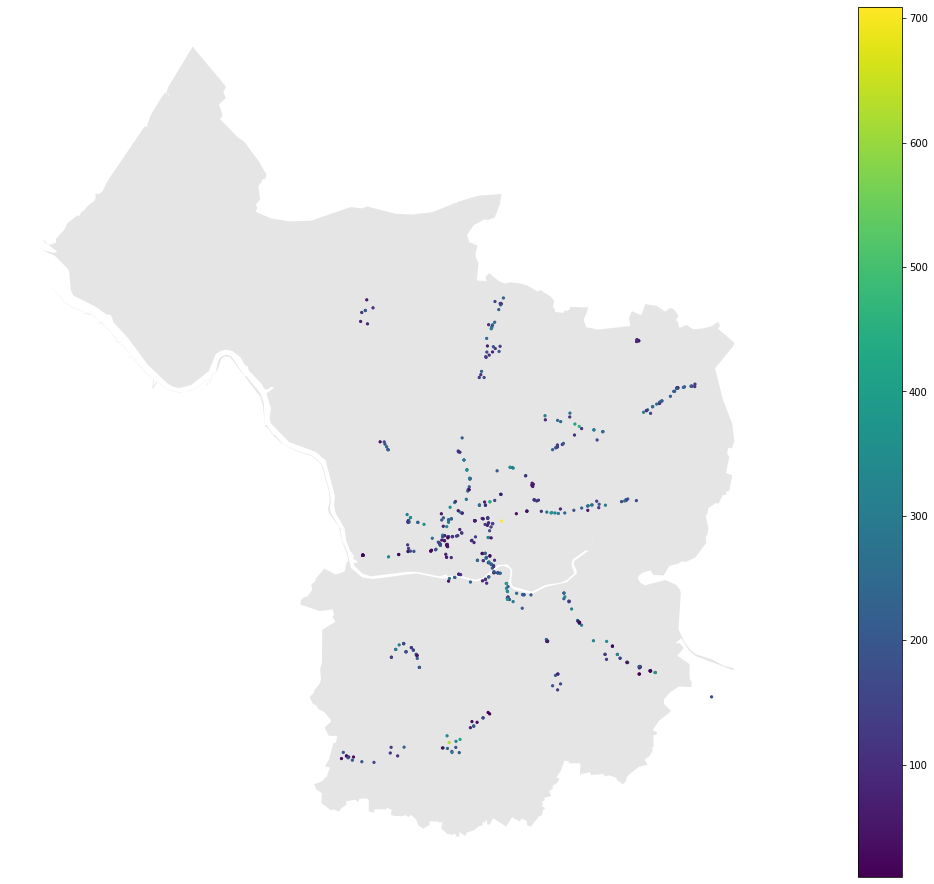

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
avg_flow_gpd2.plot(column='Hourly Flow', markersize=5, legend=True, ax=ax)
ax.set_axis_off()

***Bus Stops:***

In [ ]:
bus_stops = pd.read_csv('bus-stops.csv', delimiter=';')

bus_stops = bus_stops[bus_stops['geo_point_2d'].notnull()]

bus_stops.geo_point_2d = bus_stops.geo_point_2d.apply(lambda x: x.split(','))
bus_stops['x'] = bus_stops.geo_point_2d.apply(lambda x: x[1])
bus_stops['y'] = bus_stops.geo_point_2d.apply(lambda x: x[0])

# Convert from dataframe to geodataframe
bus_stops_gdf = gpd.GeoDataFrame(bus_stops,
                                           geometry=gpd.points_from_xy(bus_stops.x,
                                                                       bus_stops.y)).set_crs('EPSG:4326').to_crs('EPSG:27700')
bus_stops_gdf = bus_stops_gdf.rename(columns={'OBJECTID': 'Bus_Stop'})

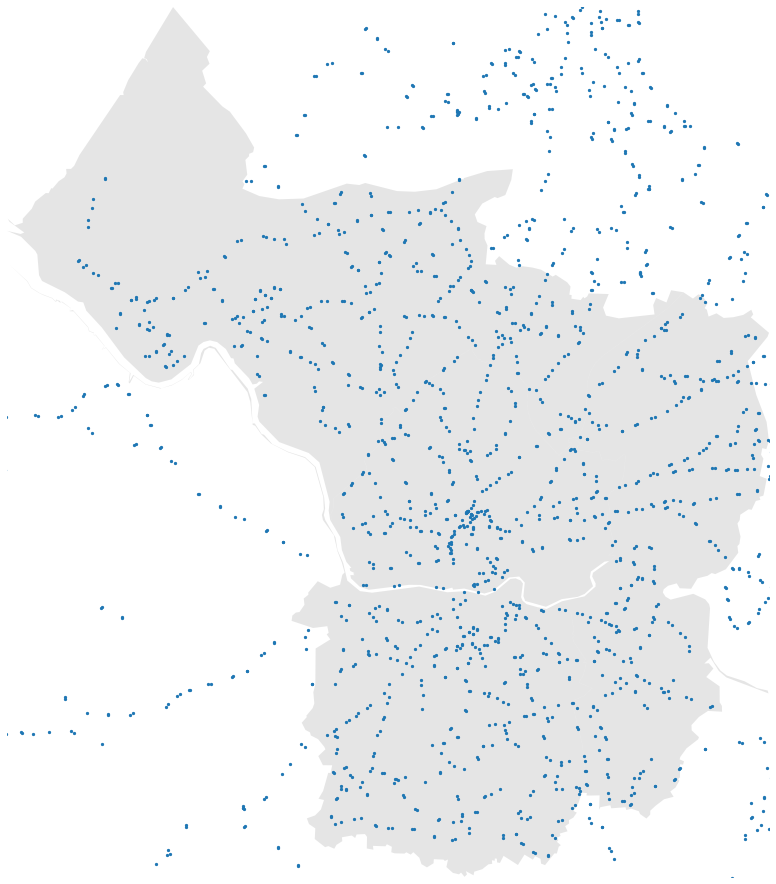

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
bus_stops_gdf.plot(markersize=5, ax=ax)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_axis_off()

***Population Density:***

In [ ]:
population = gpd.read_file('population-estimates-time-series-ward.geojson')
population = population.loc[population['mid_year'] == population['mid_year'].unique().max()]
population = population.set_crs('EPSG:4326').to_crs('EPSG:27700')

In [ ]:
population['area'] = population.geometry.apply(lambda x: x.area)
population['pop_density'] = population.apply(lambda row: row.population_estimate / row.area *10**6, axis=1)

#### ***1.6 Explore seasonal variations***

Here we explored seasonal variations and noticed that the ***number and location of sightings vary throughout the year***. Most sightings happen during Summer, which is when bats become most active, while during Winter, they hibernate:

In [ ]:
bat_records_gdf_seasons = bat_records_gdf.copy()

for index, row in bat_records_gdf_seasons.iterrows():
  try:
    bat_records_gdf_seasons.loc[index, 'date'] = dt.strptime(row.DATE_OF_RE, '%d/%m/%Y')
  except:
    bat_records_gdf_seasons.drop(index, axis=0, inplace=True)

bat_records_gdf_seasons['season'] = bat_records_gdf_seasons.date.apply(lambda x: x.month % 12 // 3 + 1)
seasons_mapping = dict(zip([1,2,3,4], ['Winter', 'Spring', 'Summer', 'Fall']))
bat_records_gdf_seasons['season'] = bat_records_gdf_seasons.season.apply(lambda x: seasons_mapping[x])

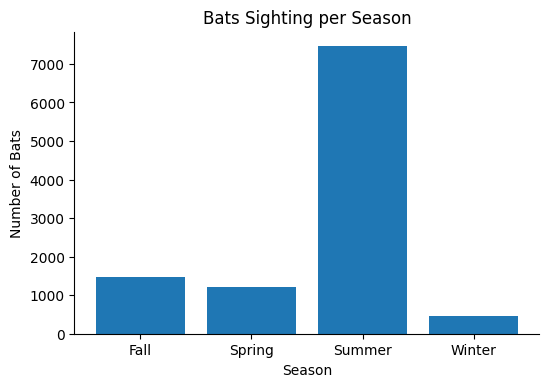

In [ ]:
seasons_plot = bat_records_gdf_seasons.groupby('season').quantity.sum()

plt.figure(figsize=(6,4), dpi=100)
plt.bar(seasons_plot.index, seasons_plot.values )
plt.xlabel('Season')
plt.ylabel('Number of Bats')
plt.title('Bats Sighting per Season')
plt.show()

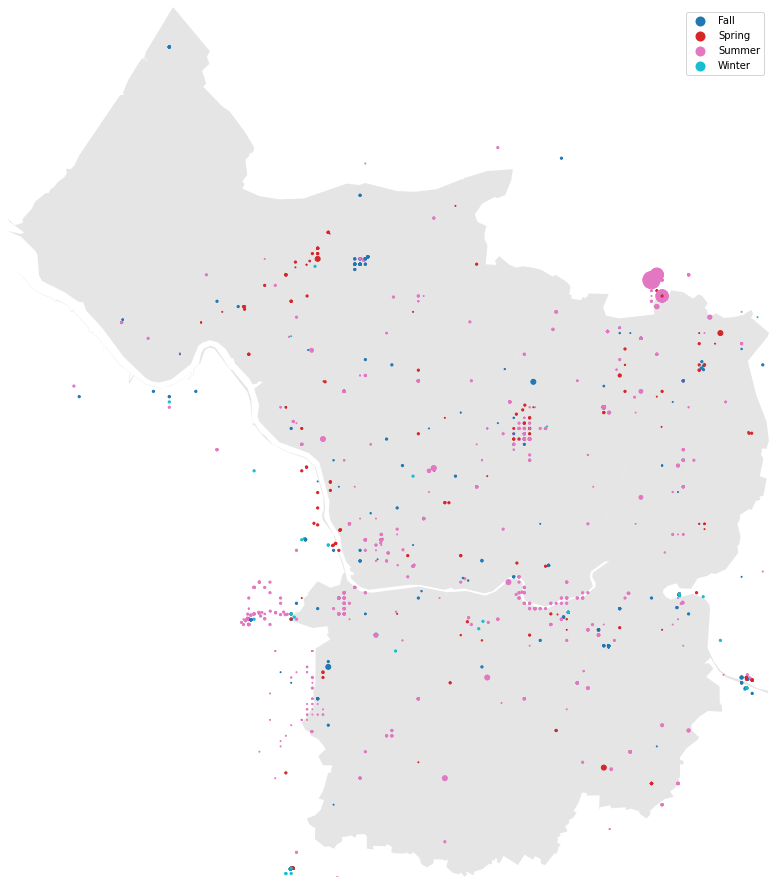

In [ ]:
fig, ax = plt.subplots()
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
bat_records_gdf_seasons.plot(column= 'season', markersize='quantity', ax=ax, legend=True)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_axis_off()

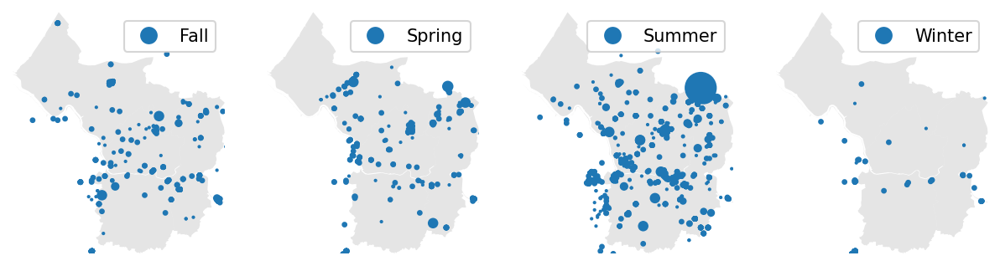

In [ ]:
_, axs = plt.subplots(1,4, figsize=(10,20), dpi=150)

for i, s in enumerate(seasons_plot.index):

  bristol_map.plot(color='grey', ax=axs[i], alpha=0.2)
  bat_records_gdf_seasons[bat_records_gdf_seasons.season==s].plot(column= 'season', markersize='quantity', ax=axs[i], legend=True)
  axs[i].set_xlim(minx, maxx)
  axs[i].set_ylim(miny, maxy)
  axs[i].set_axis_off()

#### ***1.7 Seasonal Clustering***

As a result of these seasonal variations and similarly to before, we apply the elbow method to find the optimal amount of clusters per season:

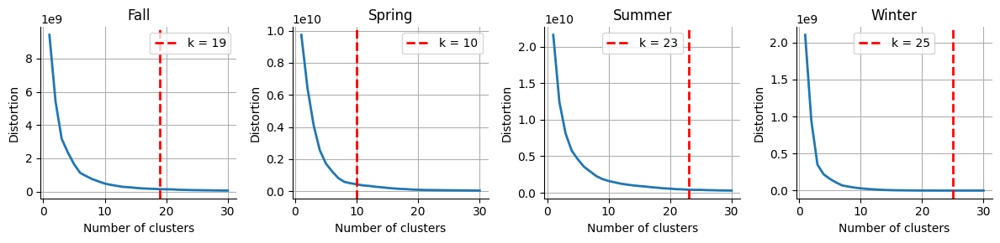

In [ ]:
_, axs = plt.subplots(1,4, figsize=(12,3), dpi=100)

# to store k per season
K = dict()

for j, s in enumerate(seasons_plot.index):

  X = bat_records_gdf_seasons[bat_records_gdf_seasons.season==s][['EASTING','NORTHING']]
  max_k = 30

  distortions = [] 
  for i in range(1, max_k + 1):
    if len(X) >= i:
      model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=5)
      model.fit(X)
      distortions.append(model.inertia_)

  # Best K: the lowest derivative
  K[s] = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i  in np.diff(distortions,2)]))

  axs[j].plot(range(1, len(distortions) + 1), distortions)
  axs[j].axvline(K[s], ls='--', color='red', label='k = ' + str(K[s]))
  axs[j].set(title=s, xlabel='Number of clusters', ylabel='Distortion')
  axs[j].legend()
  axs[j].grid(True)

plt.tight_layout()
plt.show()


In [ ]:
dtf_Xs = pd.DataFrame()
gdp_centroids_seasons = dict()

for s, k in K.items():

  X = bat_records_gdf_seasons[bat_records_gdf_seasons.season==s][['EASTING','NORTHING']]

  model = cluster.KMeans(n_clusters=k, init='k-means++')

  dtf_X = X.copy()
  dtf_X['cluster'] = model.fit_predict(X, sample_weight=bat_records_gdf_seasons[bat_records_gdf_seasons.season==s].quantity.values)

  df_centroids = pd.DataFrame(data=model.cluster_centers_, columns=['EASTING' , 'NORTHING'])
  df_centroids['quantity'] = bat_records_gdf.groupby(by='cluster').sum()['quantity']
  gdp_centroids_seasons[s] = gpd.GeoDataFrame(df_centroids, geometry=gpd.points_from_xy(df_centroids.EASTING, df_centroids.NORTHING))

  # Find real centroids
  closest, distances = vq.vq(model.cluster_centers_, dtf_X.drop('cluster', axis=1).values)

  dtf_X['centroids'] = 0
  for i in closest:
      dtf_X['centroids'].iloc[i] = 1
  
  dtf_Xs = pd.concat([dtf_Xs, dtf_X], axis=0)
      
# Add clustering information to the seasons dataset
bat_records_gdf_seasons[['cluster','centroids']] = dtf_Xs[['cluster','centroids']]

***Overall view of the clusters:***

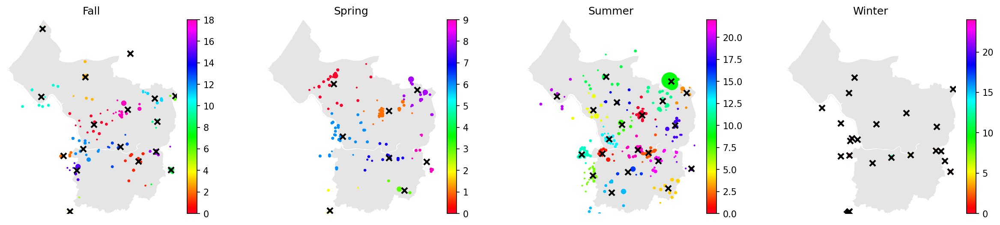

In [ ]:
fig, axs = plt.subplots(1,4,figsize=(20,4),dpi=150)

for i, (s, centr) in enumerate(gdp_centroids_seasons.items()):

  bristol_map.plot(color='grey', ax=axs[i], alpha=0.2)
  bat_records_gdf_seasons[bat_records_gdf_seasons.season==s].plot(column='cluster', ax=axs[i], legend=True, markersize='quantity', cmap='gist_rainbow')
  centr.plot(ax=axs[i], legend=True, markersize=40, marker='x', color='black')
  axs[i].set_xlim(minx, maxx)
  axs[i].set_ylim(miny, maxy)
  axs[i].set_title(s)
  axs[i].set_axis_off()

***Detailed high resolution:***

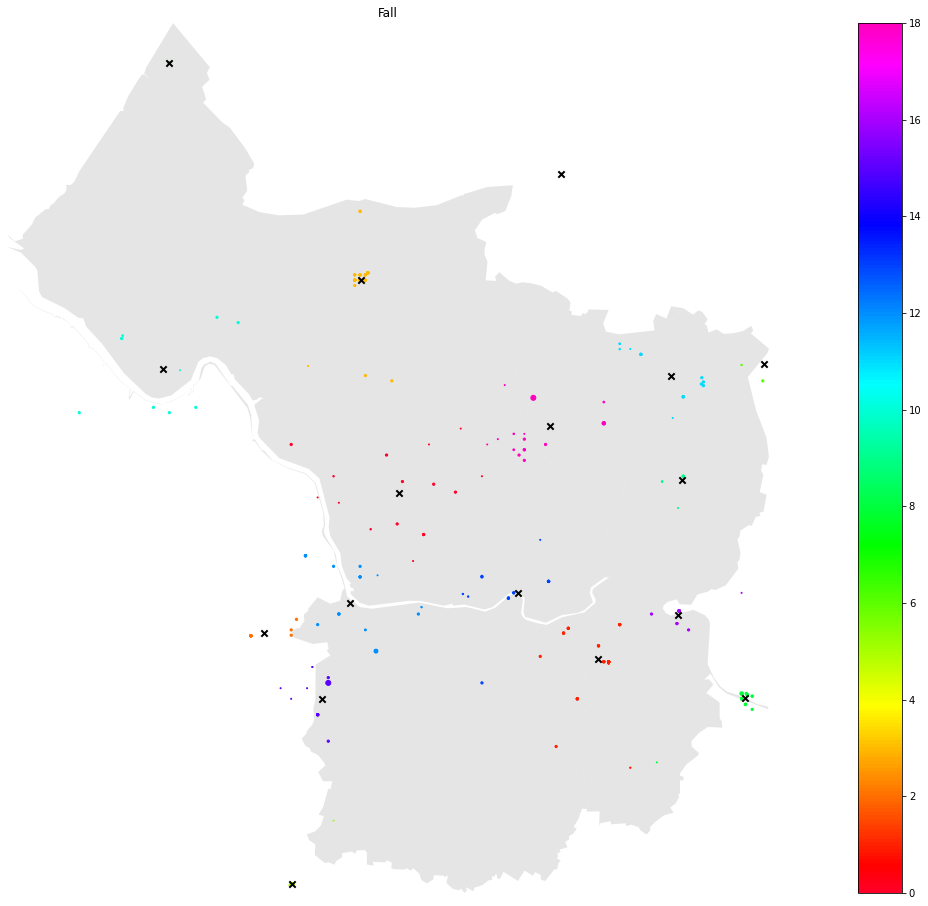

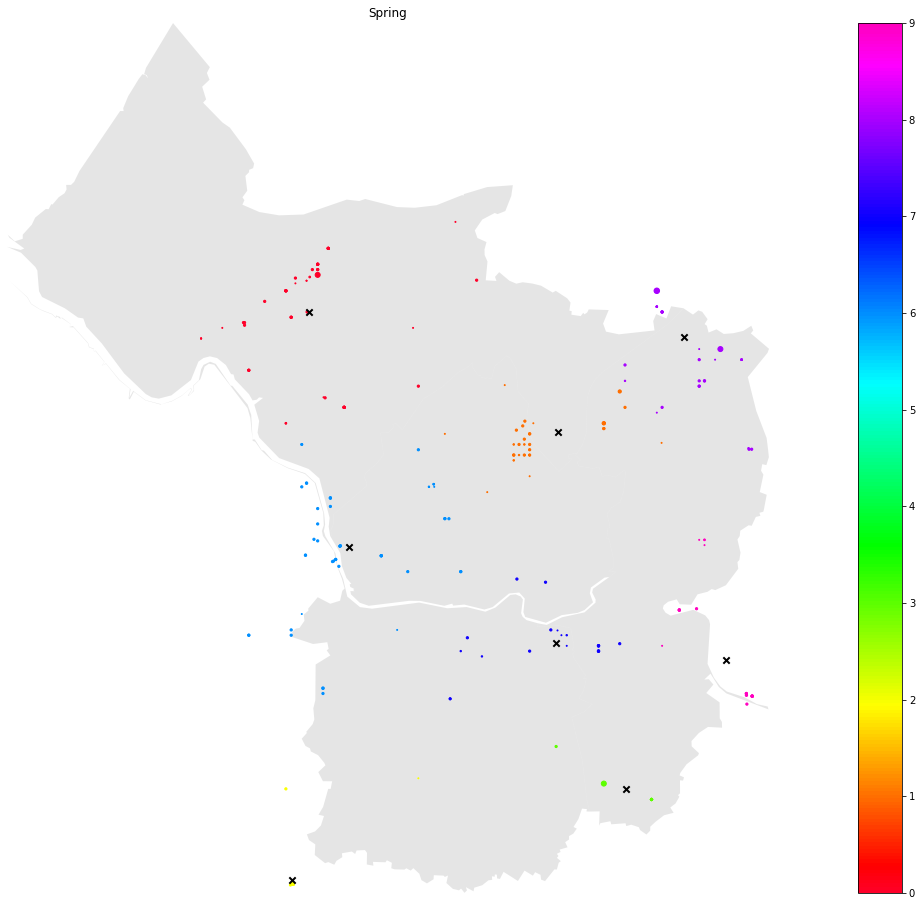

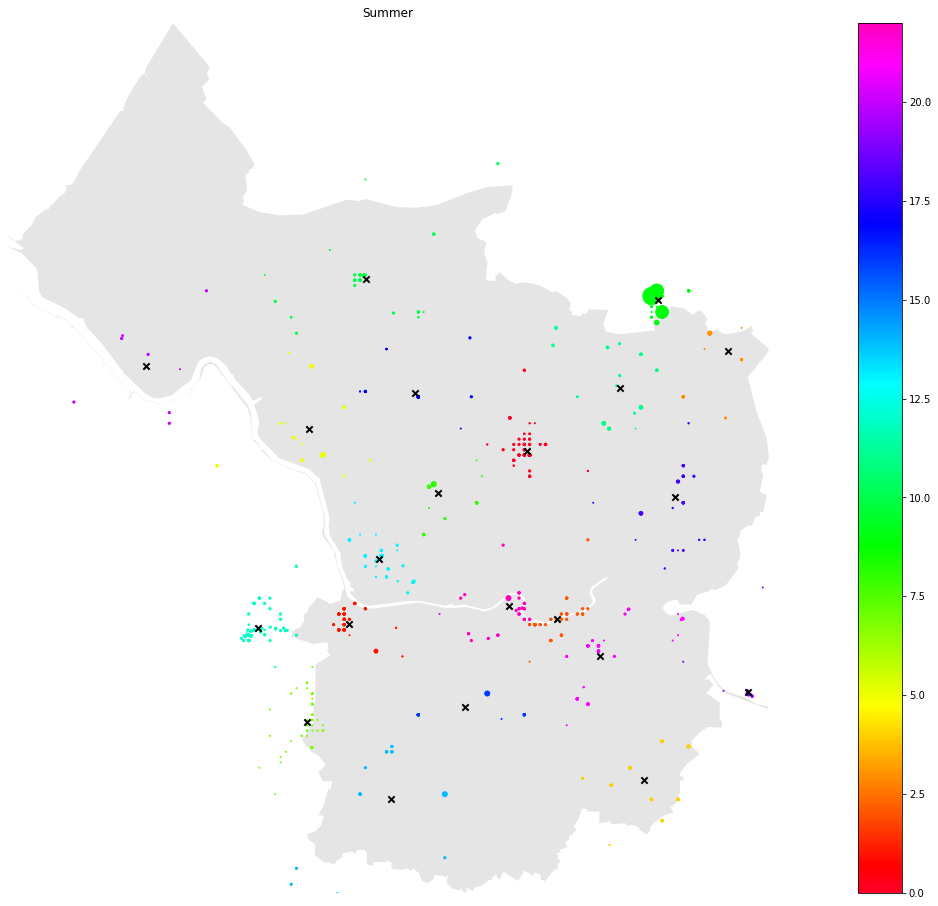

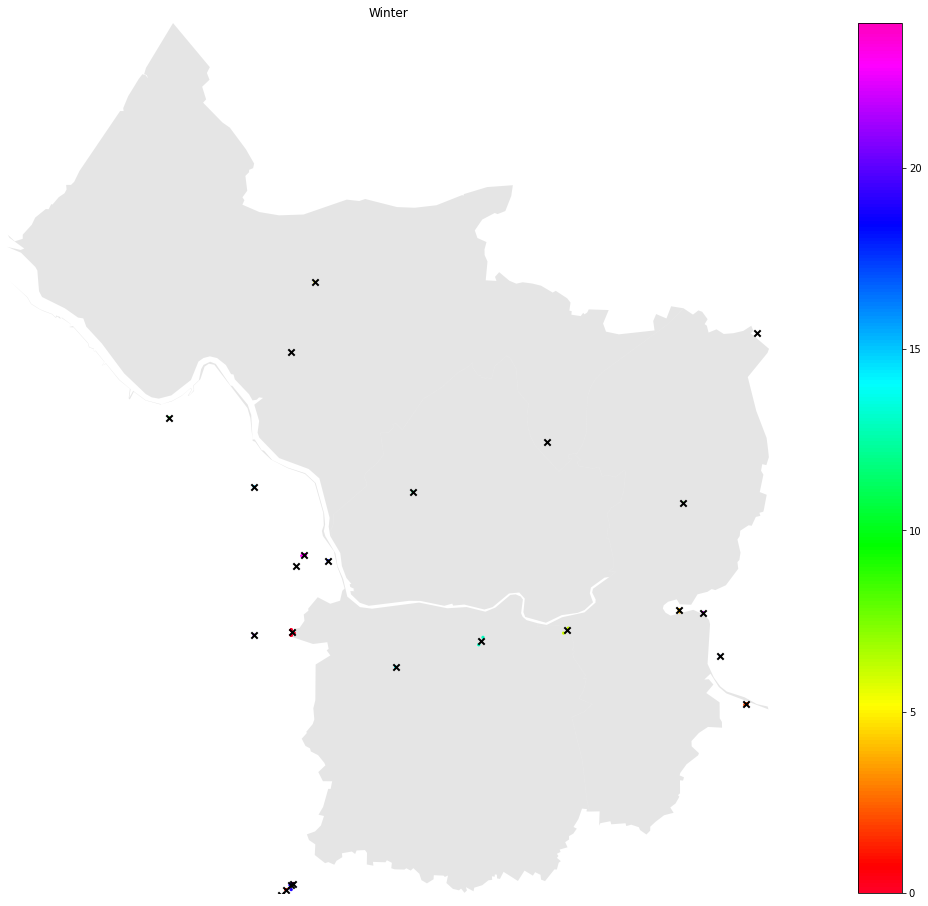

In [ ]:
for s, centr in gdp_centroids_seasons.items():

  fig, ax = plt.subplots()
  bristol_map.plot(color='grey', ax=ax, alpha=0.2)
  bat_records_gdf_seasons[bat_records_gdf_seasons.season==s].plot(column='cluster', ax=ax, legend=True, markersize='quantity', cmap='gist_rainbow')
  centr.plot(ax=ax, legend=True, markersize=40, marker='x', color='black')
  ax.set_xlim(minx, maxx)
  ax.set_ylim(miny, maxy)
  ax.set_title(s)
  ax.set_axis_off()

### ***2. Create Optimization Grid*** <a name="grid"></a>

In this section, we created a hexgrid and used it to ***divide the city of Bristol into geographical zones***. Each zone will be associated with a curated set of features.

In [ ]:
def combineBorders(*geoms):
    return cascaded_union([
        geom if geom.is_valid else geom.buffer(0) for geom in geoms
    ])

polyC = combineBorders(bristol_map.loc[0, 'geometry'], bristol_map.loc[1, 'geometry'],
                       bristol_map.loc[2, 'geometry'], bristol_map.loc[3, 'geometry'])
polyC.crs = {'init': 'EPSG:27700'}

In [ ]:
polyC_gdf = gpd.GeoDataFrame(geometry=gpd.GeoSeries(polyC))
polyC_gdf = polyC_gdf.set_crs('EPSG:27700')

Use ***h3fy*** to generate a hexgrid geodataframe clipped to the boundaries of Bristol:

In [ ]:
hexgrid = h3fy(polyC_gdf, resolution=10, clip=True)
hexgrid.reset_index(drop=True, inplace=True)

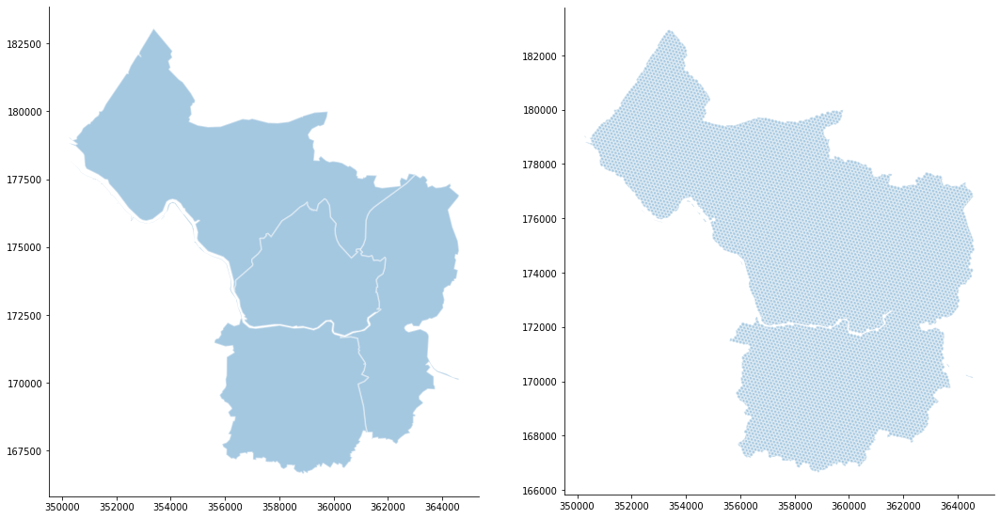

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(18,10))
axs = axs.flatten()

bristol_map.plot(ax=axs[0], alpha=0.4, linewidth=1.6, edgecolor='white')
hexgrid.plot(ax=axs[1], alpha=0.4, linewidth=1.6, edgecolor='white')

In this coordinate system, 1 km<sup>2</sup> $\approx$ 1000000 area units. We ended up with 7870 hexagons, each one with approximately 73 meters of side.

### ***3. Feature Extraction*** <a name="feature"></a>

We developed the following methods to calculate a set of features for each geographical zone and visualize them:

In [ ]:
def get_distance_to(hexgrid, gdf, name):
  for idx, zone in hexgrid.iterrows():
    center = zone.geometry
    min_distance = gdf.geometry.distance(center).min()
    hexgrid.loc[idx, 'dist_nearest_' + name] = min_distance

  return hexgrid

def get_sum_in_radius(hexgrid, gdf, name, radius=100):

  for idx, zone in hexgrid.iterrows():
    center = zone.geometry
    distances = gdf.geometry.distance(center)
    indices = distances[distances < radius].index
    sum = gdf.loc[indices][name].sum()

    hexgrid.loc[idx, 'sum_' + name + '_' + str(radius) + 'm_radius' ] = sum

  return hexgrid

def get_occurences_in_radius(hexgrid, gdf, name, radius=100):

  for idx, zone in hexgrid.iterrows():
    center = zone.geometry
    distances = gdf.geometry.distance(center)
    indices = distances[distances < radius].index
    count = gdf.loc[indices][name].count()

    hexgrid.loc[idx, 'count_' + name + '_' + str(radius) + 'm_radius' ] = count

  return hexgrid

def geopandas_plot(df, col, title):
  fig, ax = plt.subplots()
  df.plot(column=col, legend=True, ax=ax)
  ax.set_title(title)
  ax.set_axis_off()

#### ***3.1 Bat-oriented features***

***Proximity to prey:***

Although we have records since 1990, the city might have changed since then and an area that once provided the kind of habitat requirements that moths need does not mean it still does. With that in mind, we assigned less weight to older records:

In [ ]:
for year, weight in zip(sorted(moth_records_gdf.Year_Date.unique()), np.linspace(0, 1, num=len(moth_records_gdf.Year_Date.unique()))):
  moth_records_gdf.loc[moth_records_gdf.Year_Date == year, 'weight'] = weight

In [ ]:
for idx, zone in hexgrid.iterrows():
  center = zone.geometry
  distances = moth_records_gdf.geometry.distance(center)

  # Consider moth sightings within 1km
  indices = distances[distances < 1000].index
  num_preys = (moth_records_gdf.loc[indices].quantity * moth_records_gdf.loc[indices].weight).sum()

  hexgrid.loc[idx, 'num_preys'] = num_preys

We can see by the following plot that there are mainly three spots with a significantly larger number of moth sightings:

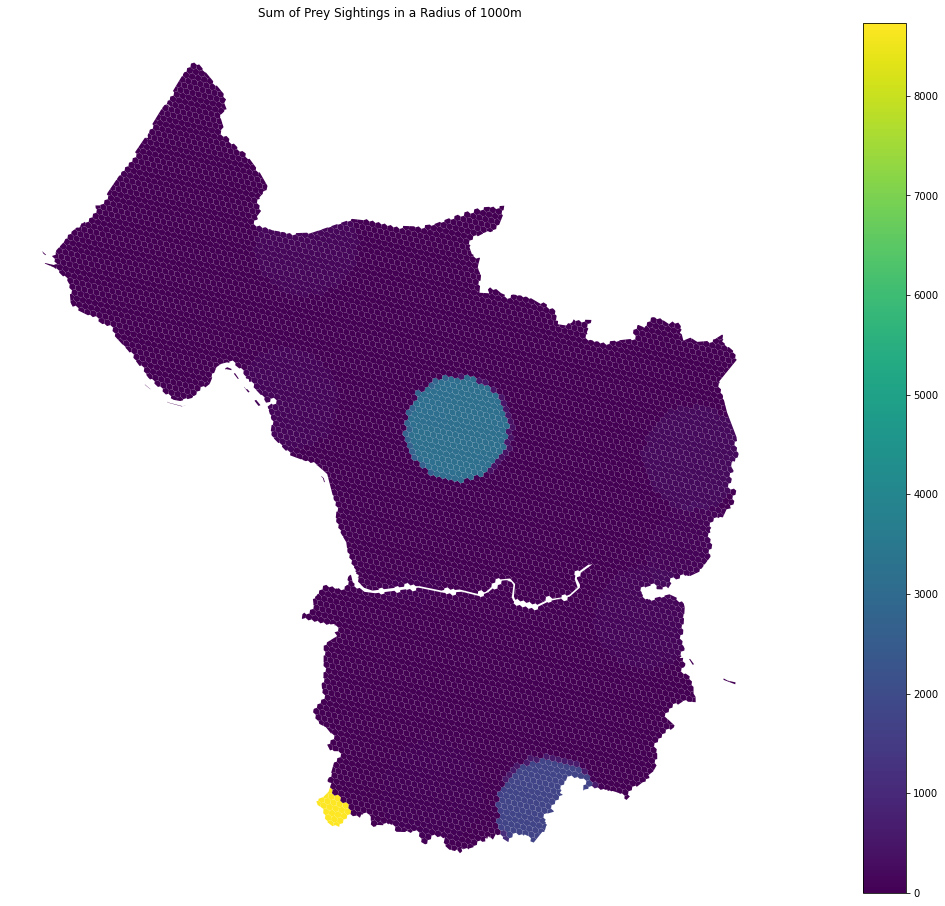

In [ ]:
geopandas_plot(hexgrid, col='num_preys', title='Sum of Prey Sightings in a Radius of 1000m')

***Proximity to wildlife corridors:***

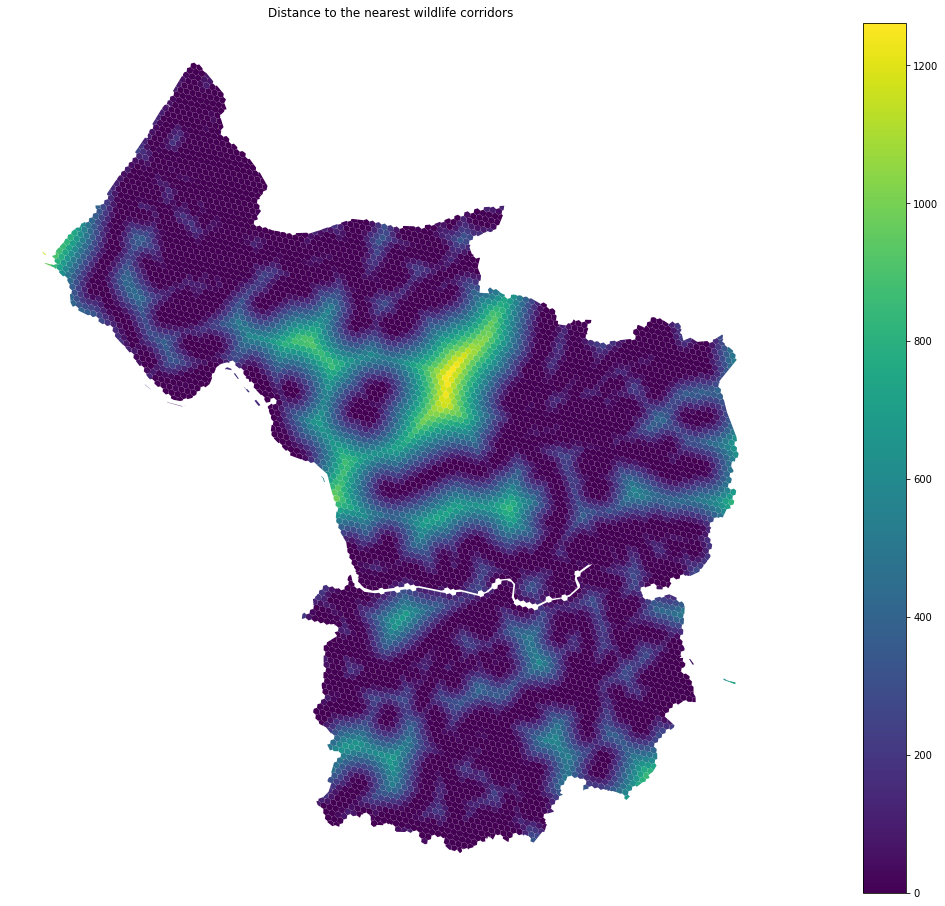

In [ ]:
hexgrid = get_distance_to(hexgrid, wildlife_corridors, 'wildlife_corridors')
geopandas_plot(hexgrid, col='dist_nearest_wildlife_corridors', title='Distance to the nearest wildlife corridors')

***Proximity to green alleys:***

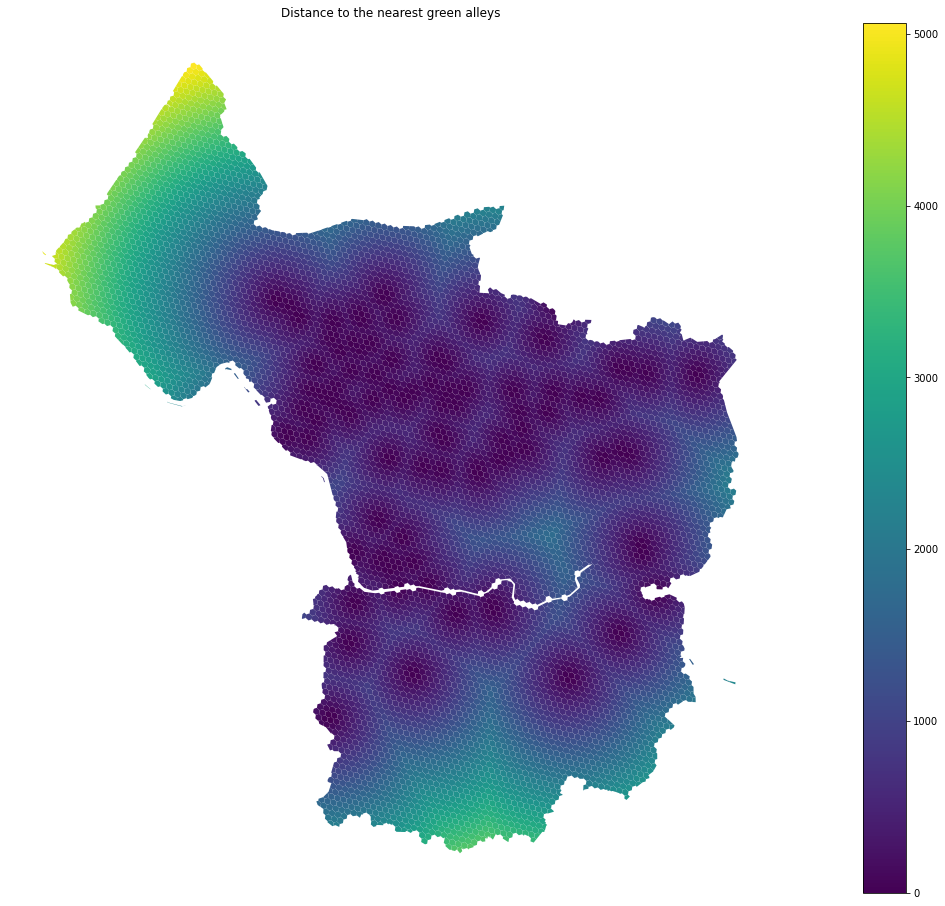

In [ ]:
hexgrid = get_distance_to(hexgrid, green_alley_species_gdf, 'green_alleys')
geopandas_plot(hexgrid, col='dist_nearest_green_alleys', title='Distance to the nearest green alleys')

***Proximity to water bodies:***

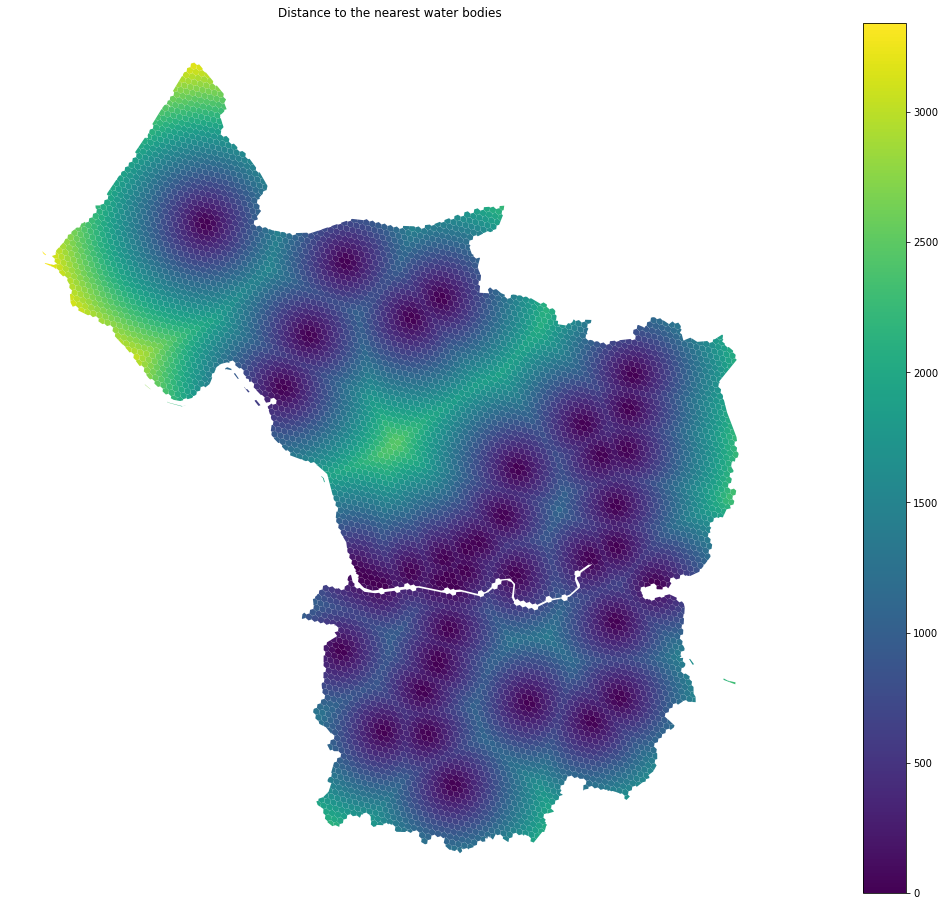

In [ ]:
hexgrid = get_distance_to(hexgrid, water_bodies_gdf, 'water_bodies')
geopandas_plot(hexgrid, col='dist_nearest_water_bodies', title='Distance to the nearest water bodies')

#### ***3.2 Human-oriented features***

***Flow Counts:***

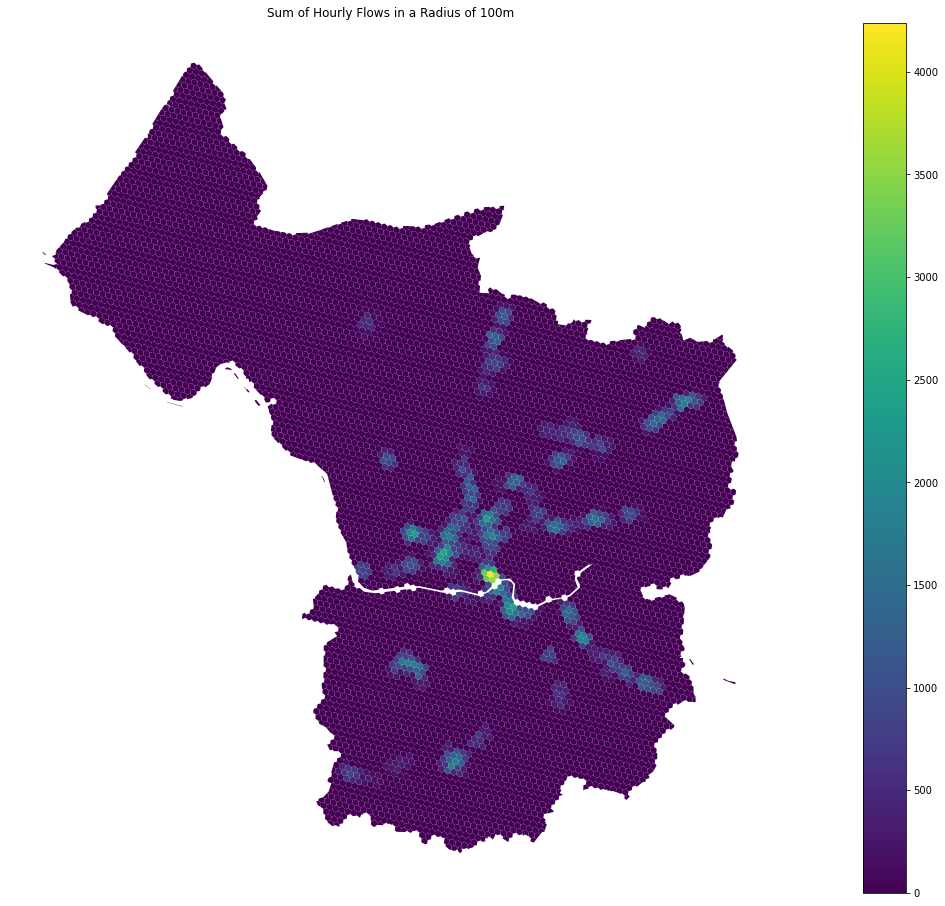

In [ ]:
hexgrid = get_sum_in_radius(hexgrid, avg_flow_gpd, 'Hourly Flow', radius=100)
geopandas_plot(hexgrid, 'sum_Hourly Flow_100m_radius', 'Sum of Hourly Flows in a Radius of 100m')

***Bus Stops:***

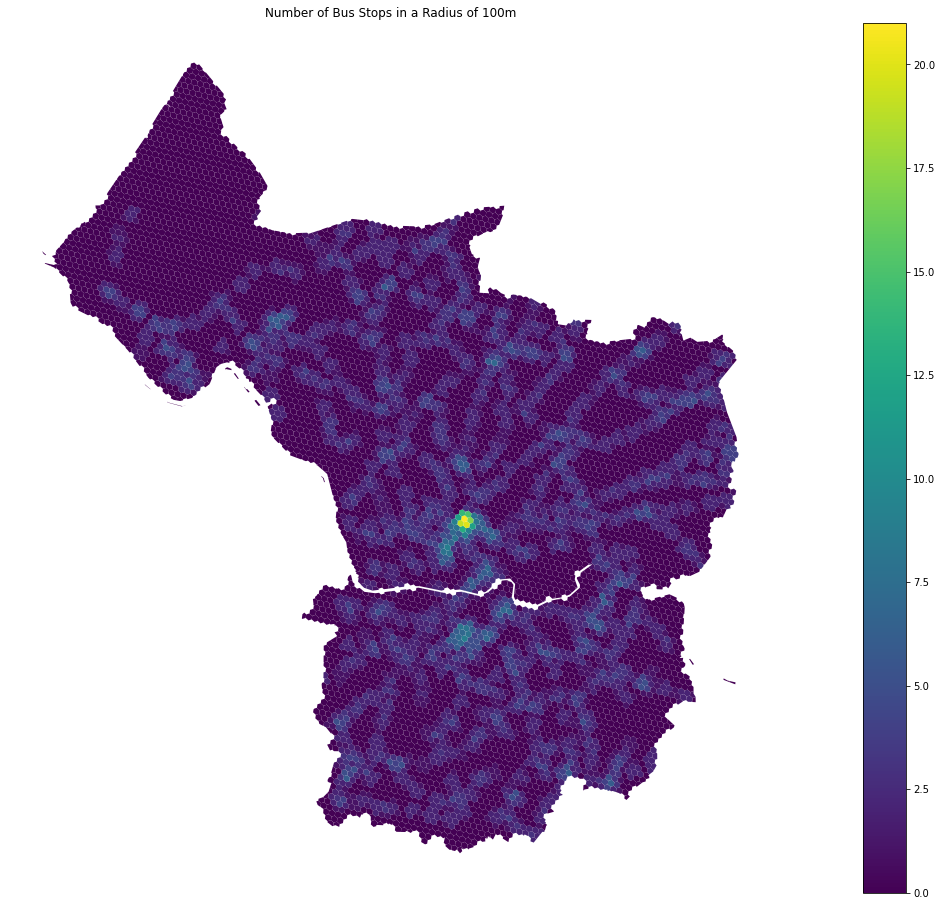

In [ ]:
bus_fts = get_occurences_in_radius(hexgrid, bus_stops_gdf, 'Bus_Stop', radius=100)
geopandas_plot(bus_fts, 'count_Bus_Stop_100m_radius', 'Number of Bus Stops in a Radius of 100m')

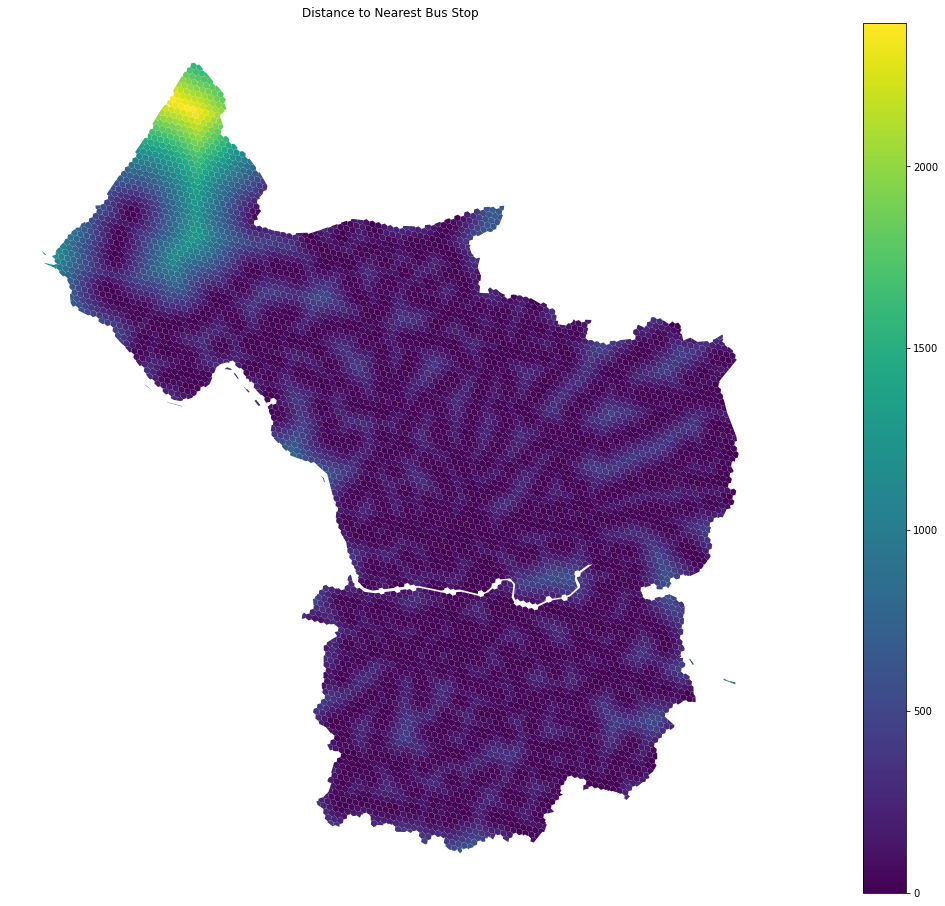

In [ ]:
bus_fts = get_distance_to(hexgrid, bus_stops_gdf, 'Bus_Stop')
geopandas_plot(bus_fts, 'dist_nearest_Bus_Stop', 'Distance to Nearest Bus Stop')

***Population Density:***

In [ ]:
for idx, zone in hexgrid.iterrows():
    center = zone.geometry.centroid
    indices = population.geometry.contains(center)

    pop_dens = population.pop_density.loc[indices].mean()

    hexgrid.loc[idx, 'pop_density'] = pop_dens

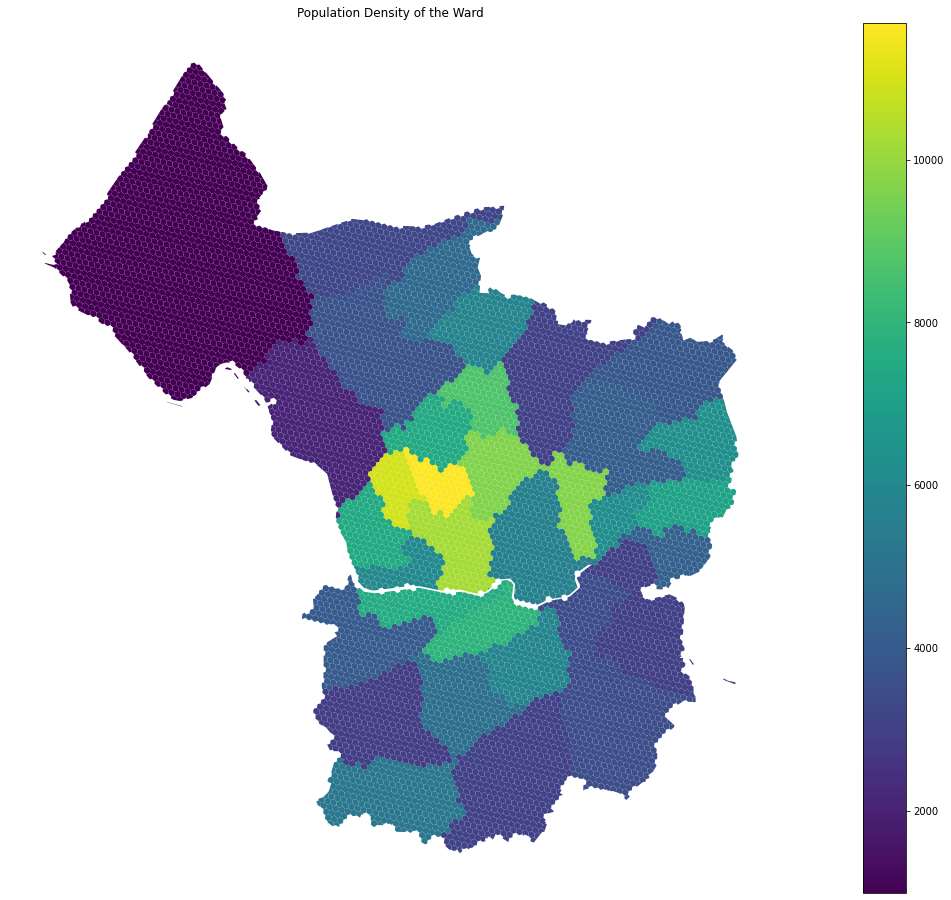

In [ ]:
geopandas_plot(hexgrid, 'pop_density', 'Population Density of the Ward')

#### ***3.3 One-Year Long Cluster Profiling***

In this section, we calculated a set of features for each cluster such as the quantity of sightings or the presence of relevant behaviours. This way, we can also assign an importance score to each cluster.

Calculate cluster density:

In [ ]:
def cluster_density(bat_records_gdf, gpd_centroids):

  for cluster_id in bat_records_gdf.cluster.unique(): 
    centroid_x, centroid_y = gpd_centroids.loc[cluster_id, 'NORTHING'], gpd_centroids.loc[cluster_id, 'EASTING']
    total_distance = 0
    this_bat_records = bat_records_gdf[bat_records_gdf.cluster == cluster_id]

    for i, point in this_bat_records.iterrows(): 
      point_x,point_y =  point['NORTHING'], point['EASTING']
      total_distance = total_distance + np.sqrt((centroid_x-point_x)**2 + (centroid_y-point_y)**2)
      
    gpd_centroids.loc[cluster_id, 'density'] = total_distance / len(this_bat_records)

In [ ]:
cluster_density(bat_records_gdf, gpd_centroids)

Calculate quantity of sightings:

In [ ]:
def quantity_sightings(bat_records_gdf, gpd_centroids):

  for cluster_id in bat_records_gdf.cluster.unique(): 
    this_bat_records = bat_records_gdf[bat_records_gdf.cluster == cluster_id]
    gpd_centroids.loc[cluster_id, 'quantity'] = this_bat_records['quantity'].sum()

In [ ]:
quantity_sightings(bat_records_gdf, gpd_centroids)

Calculate presence of relevant behaviours:

In [ ]:
def important_behaviours(bat_records_gdf, gpd_centroids):

  for cluster_id in bat_records_gdf.cluster.unique(): 
    this_bat_records = bat_records_gdf[bat_records_gdf.cluster == cluster_id]
    gpd_centroids.loc[cluster_id, 'important_behaviour'] = 0
    if this_bat_records.SEX_STAGE.isin(['breeding', 'nursery colony', 'feeding', 'roosting', 'hibernating']).any(): 
      gpd_centroids.loc[cluster_id, 'important_behaviour'] = 1


In [ ]:
important_behaviours(bat_records_gdf, gpd_centroids)

Calculate proportion of juvenile bats:

In [ ]:
def proportion_juvenile_bats(bat_records_gdf, gpd_centroids):

  for cluster_id in bat_records_gdf.cluster.unique(): 
    this_bat_records = bat_records_gdf[bat_records_gdf.cluster == cluster_id]
    gpd_centroids.loc[cluster_id, 'proportion_young'] = len(this_bat_records[this_bat_records.SEX_STAGE.isin(['young'])])/len(this_bat_records) 

In [ ]:
proportion_juvenile_bats(bat_records_gdf, gpd_centroids)

Calculate mean protected weight:

In [ ]:
def mean_protected_weight(bat_records_gdf, gpd_centroids):
  for cluster_id in bat_records_gdf.cluster.unique(): 
    this_bat_records = bat_records_gdf[bat_records_gdf.cluster == cluster_id]
    gpd_centroids.loc[cluster_id, 'protected_weight'] = this_bat_records['protected_weight'].mean()
    

In [ ]:
mean_protected_weight(bat_records_gdf, gpd_centroids)

Calculate proportion of sightings in the last 5 years:

In [ ]:
def proportion_sightings_last_5_years(bat_records_gdf, gpd_centroids):

  for cluster_id in bat_records_gdf.cluster.unique(): 
    this_bat_records = bat_records_gdf[bat_records_gdf.cluster == cluster_id]
    gpd_centroids.loc[cluster_id, 'proportion_last_5_years'] = np.count_nonzero(this_bat_records['YEAR_DATE'] >= 2016) / len(this_bat_records)

In [ ]:
proportion_sightings_last_5_years(bat_records_gdf, gpd_centroids)

Calculate number of moths sightings near the cluster center:

In [ ]:
def number_moths(moth_records_gdf,bat_records_gdf, gpd_centroids):

  for idx, zone in moth_records_gdf.iterrows():
    center = zone.geometry
    distances = gpd_centroids.geometry.distance(center)
    moth_records_gdf.loc[idx, 'cluster'] = distances.argmin()

  for cluster_id in bat_records_gdf.cluster.unique(): 
    this_moth_records = moth_records_gdf[moth_records_gdf.cluster == cluster_id]
    gpd_centroids.loc[cluster_id, 'n_moths'] = this_moth_records['quantity'].sum()

In [ ]:
number_moths(moth_records_gdf,bat_records_gdf, gpd_centroids)

***Calculate importance of each cluster:***

In [ ]:
norm_centroid_features = MinMaxScaler().fit_transform(gpd_centroids[['quantity', 'important_behaviour', 'density', 'protected_weight', 'proportion_last_5_years', 'proportion_young', 'n_moths']]) 
gpd_centroids['importance'] = MinMaxScaler().fit_transform(norm_centroid_features.sum(axis=-1).reshape(-1, 1))

In [ ]:
gpd_centroids.sample(5)

,EASTING,NORTHING,quantity,geometry,density,important_behaviour,proportion_young,protected_weight,proportion_last_5_years,n_moths,importance
11,362961.740260,173289.922078,385,POINT (362961.740 173289.922),1092.671285,0.0,0.000000,2.600000,0.120000,610.0,0.512567
0,361201.528937,171100.538358,743,POINT (361201.529 171100.538),638.802674,1.0,0.017045,2.863636,0.073864,254.0,0.822898
8,357959.367397,168901.094891,411,POINT (357959.367 168901.095),1041.792194,0.0,0.010989,2.758242,0.428571,64.0,0.704293
17,355256.163121,171314.744681,705,POINT (355256.163 171314.745),834.629737,0.0,0.058824,2.449198,0.010695,67.0,0.659676
9,348069.831461,176856.573034,178,POINT (348069.831 176856.573),902.674091,0.0,0.000000,2.000000,0.312500,0.0,0.449274


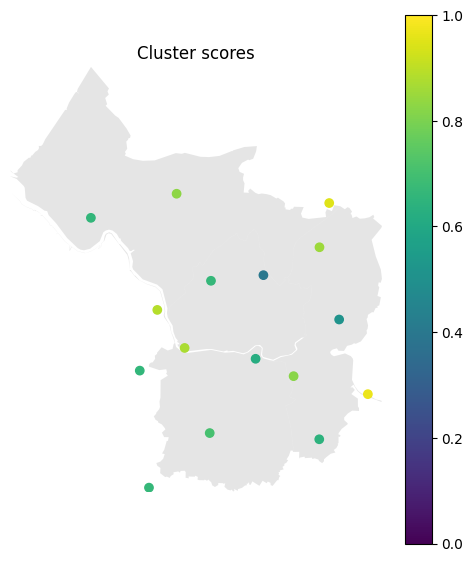

In [ ]:
fig, ax = plt.subplots(figsize=(6,7),dpi=100)
bristol_map.plot(color='grey', ax=ax, alpha=0.2)
gpd_centroids.plot(column='importance', ax=ax, legend=True)
ax.set_title('Cluster scores')
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_axis_off()

#### ***3.4 Seasonal Cluster Profiling***

In [ ]:
for s, k in K.items():
  
  cluster_density(bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])
  quantity_sightings(bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])
  important_behaviours(bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])
  proportion_juvenile_bats(bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])
  mean_protected_weight(bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])
  proportion_sightings_last_5_years(bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])
  number_moths(moth_records_gdf,bat_records_gdf_seasons[bat_records_gdf_seasons.season == s], gdp_centroids_seasons[s])

  norm_centroid_fts = MinMaxScaler().fit_transform(gdp_centroids_seasons[s][['quantity', 'important_behaviour',
                                                                             'density', 'protected_weight', 'proportion_last_5_years', 'proportion_young', 'n_moths']]) 
  gdp_centroids_seasons[s]['importance'] = MinMaxScaler().fit_transform(norm_centroid_fts.sum(axis=-1).reshape(-1, 1))

In [ ]:
 gdp_centroids_seasons['Summer'].sample(5)

,EASTING,NORTHING,quantity,geometry,density,important_behaviour,proportion_young,protected_weight,proportion_last_5_years,n_moths,importance
17,357935.574324,176075.371622,148.0,POINT (357935.574 176075.372),404.110975,0.0,0.000000,2.735294,0.088235,4011.0,0.283140
5,355943.087248,175391.946309,149.0,POINT (355943.087 175391.946),889.090311,0.0,0.000000,2.741935,0.225806,300.0,0.450172
3,363839.344262,176872.131148,96.0,POINT (363839.344 176872.131),845.882040,0.0,0.045455,2.727273,0.045455,13.0,0.378393
11,361799.581006,176156.731844,323.0,POINT (361799.581 176156.732),787.491566,1.0,0.000000,2.485294,0.235294,20.0,0.676310
2,360608.108108,171800.450450,222.0,POINT (360608.108 171800.450),395.288435,0.0,0.000000,2.880000,0.020000,7.0,0.199670


### ***4. Create Final Scores*** <a name="score"></a>

#### ***4.1 Animal 'Discomfort' Score***

First, we scaled the bat-related features between 0 and 1:

In [ ]:
geometry = hexgrid['geometry']
bat_features = ['num_preys', 'dist_nearest_wildlife_corridors', 'dist_nearest_green_alleys', 'dist_nearest_water_bodies']
features = hexgrid[bat_features]

scaler = MinMaxScaler()
features = scaler.fit_transform(np.array(features))

features = pd.DataFrame(features, columns=bat_features)
hexgrid_final = pd.concat([geometry, features], axis=1)

The final score is a combination of all features: we decided to assign the same weight to all features but we considered the distances to have a positive effect to the animal 'discomfort' score and the number of preys to have a negative effect. Finally, we also scaled it between 0 and 1.

In [ ]:
hexgrid_final['animal_score'] = hexgrid_final['dist_nearest_wildlife_corridors'] + hexgrid_final['dist_nearest_green_alleys'] + hexgrid_final['dist_nearest_water_bodies'] - hexgrid_final['num_preys']
hexgrid_final['animal_score'] = scaler.fit_transform(np.array(hexgrid_final['animal_score']).reshape(-1, 1))

In [ ]:
hexgrid_final = gpd.GeoDataFrame(hexgrid_final, crs='EPSG:27700')

***Plot final score:***

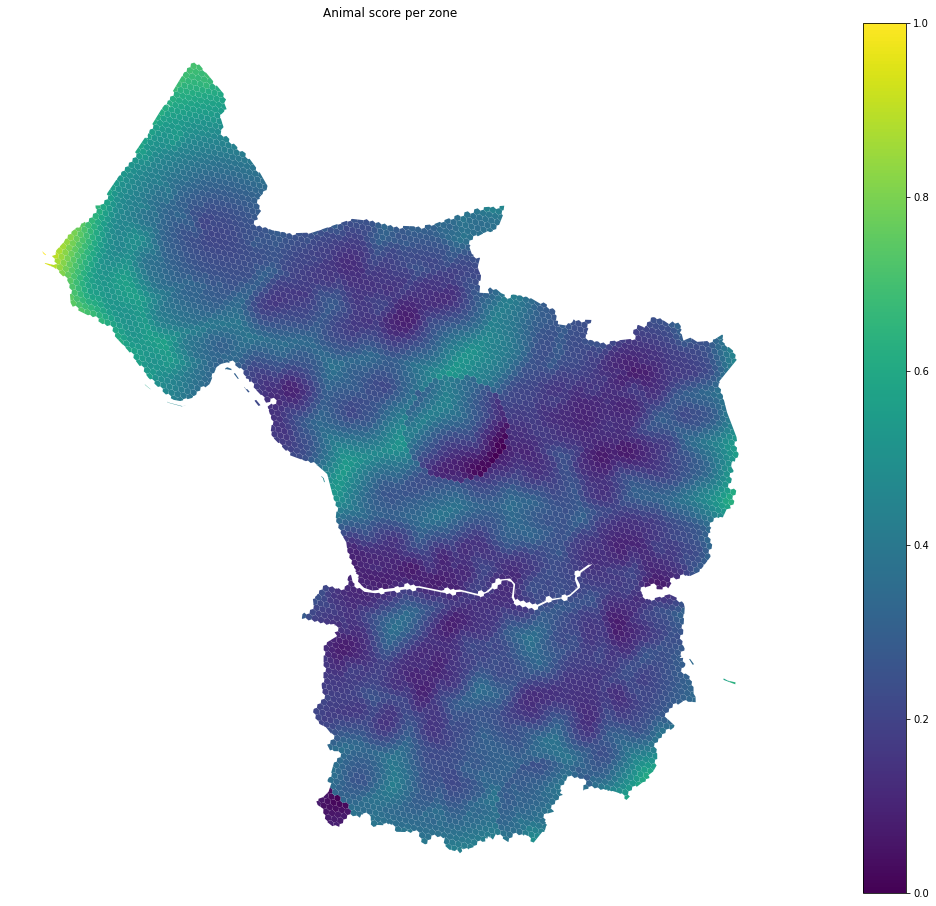

In [ ]:
fig, ax = plt.subplots()
hexgrid_final.plot(column='animal_score', ax=ax, legend=True)
ax.set_title('Animal score per zone')
ax.set_axis_off()

#### ***4.2 Human 'Discomfort' Score***

We used the same rationale to calculate a human 'discomfort' score, except this time we assigned different weights to each feature:

In [ ]:
human_features = ['count_Bus_Stop_100m_radius', 'dist_nearest_Bus_Stop', 'sum_Hourly Flow_100m_radius', 'pop_density']
features = hexgrid[human_features]

scaler = MinMaxScaler()
features = scaler.fit_transform(np.array(features))

features = pd.DataFrame(features, columns=human_features)
hexgrid_final = pd.concat([hexgrid_final, features], axis=1)

In [ ]:
hexgrid_final['human_score'] = -4 * hexgrid_final['dist_nearest_Bus_Stop'] + 3 * hexgrid_final['pop_density'] + 2 * hexgrid_final['count_Bus_Stop_100m_radius'] + hexgrid_final['sum_Hourly Flow_100m_radius']
hexgrid_final['human_score'] = scaler.fit_transform(np.array(hexgrid_final['human_score']).reshape(-1, 1))

***Plot final score:***

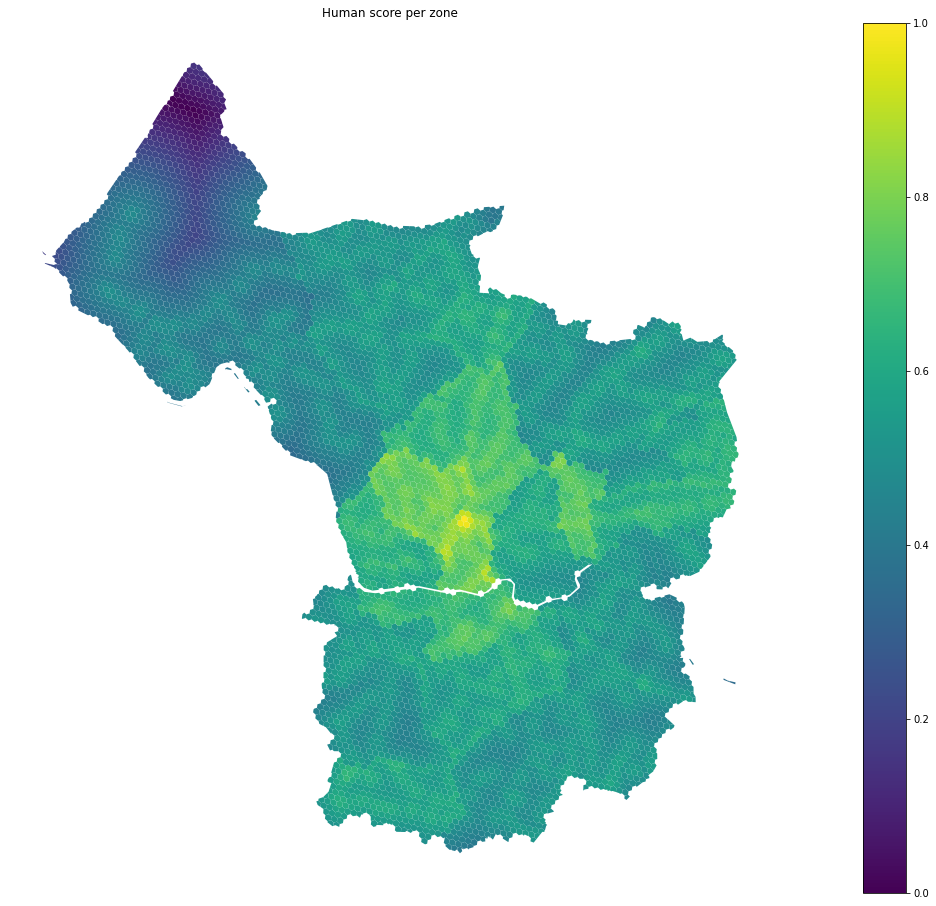

In [ ]:
fig, ax = plt.subplots()
hexgrid_final.plot(column='human_score', ax=ax, legend=True)
ax.set_title('Human score per zone')
ax.set_axis_off()

#### ***4.3 One-Year Long Cluster Score***

For each zone, find if it contains the centroid of a cluster, what is the nearest cluster, and what is the importance of such cluster:

In [ ]:
for i, centroid in gpd_centroids.iterrows():
  for j, zone in hexgrid_final.iterrows():
    if zone.geometry.contains(centroid.geometry):
      hexgrid_final.loc[j, 'contains_cluster'] = 1

hexgrid_final.loc[hexgrid_final['contains_cluster'].isna(), 'contains_cluster'] = 0

In [ ]:
for j, zone in hexgrid_final.iterrows():
  nearest_cluster = gpd_centroids.geometry.distance(zone.geometry).idxmin()
  cluster_score = gpd_centroids.loc[nearest_cluster, 'importance']
  
  hexgrid_final.loc[j, 'nearest_cluster'] = nearest_cluster
  hexgrid_final.loc[j, 'cluster_score'] = cluster_score

In [ ]:
hexgrid_final.drop(bat_features + human_features, axis=1).sample(5)

,geometry,animal_score,human_score,contains_cluster,nearest_cluster,cluster_score
2795,"POLYGON ((353453.004 177054.816, 353441.952 17...",0.380894,0.426546,0.0,12.0,0.659835
4779,"POLYGON ((357883.937 175745.572, 357872.902 17...",0.332877,0.540054,0.0,18.0,0.667125
165,"POLYGON ((359271.401 167995.778, 359260.370 16...",0.277892,0.510203,0.0,8.0,0.704293
7350,"POLYGON ((353119.045 179494.068, 353107.991 17...",0.275807,0.272263,0.0,12.0,0.659835
2557,"POLYGON ((355507.290 175766.057, 355496.246 17...",0.198343,0.436717,0.0,1.0,0.887239


In [ ]:
hexgrid_final.drop(bat_features + human_features, axis=1).to_csv('oneYear_hexgrid/allYear.csv')

#### ***4.4 Seasonal Cluster Scores***

In [ ]:
for s, k in K.items():
  hexgrid_seasons = hexgrid_final.drop(['contains_cluster', 'nearest_cluster', 'cluster_score'], axis=1)

  for i, centroid in gdp_centroids_seasons[s].iterrows():
    for j, zone in hexgrid_seasons.iterrows():
      if zone.geometry.contains(centroid.geometry):
        hexgrid_seasons.loc[j, 'contains_cluster'] = 1

  hexgrid_seasons.loc[hexgrid_seasons['contains_cluster'].isna(), 'contains_cluster'] = 0

  for j, zone in hexgrid_seasons.iterrows():
    nearest_cluster = gdp_centroids_seasons[s].geometry.distance(zone.geometry).idxmin()
    cluster_score = gdp_centroids_seasons[s].loc[nearest_cluster, 'importance']
    
    hexgrid_seasons.loc[j, 'nearest_cluster'] = nearest_cluster
    hexgrid_seasons.loc[j, 'cluster_score'] = cluster_score
  
  hexgrid_seasons.drop(bat_features + human_features, axis=1).to_csv(f'seasonal_hexgrid/{s}.csv')

In [ ]:
hexgrid_seasons.drop(bat_features + human_features, axis=1).sample(5)

,geometry,animal_score,human_score,contains_cluster,nearest_cluster,cluster_score
6803,"POLYGON ((354147.999 178231.800, 354136.949 17...",0.271023,0.444023,0.0,5.0,0.335944
3588,"POLYGON ((360375.549 174798.916, 360364.525 17...",0.111182,0.746923,0.0,11.0,0.322204
50,"POLYGON ((358225.499 167465.227, 358214.463 16...",0.354423,0.592994,0.0,24.0,0.911165
973,"POLYGON ((360036.422 171738.797, 360025.395 17...",0.150557,0.769285,0.0,6.0,0.840070
4135,"POLYGON ((358966.083 171888.363, 358955.052 17...",0.165363,0.691922,0.0,13.0,0.975927


Save the clusters' centroids coordinates for optimization

In [ ]:
for s, k in K.items():
  gdp_centroids_seasons[s].to_csv(f'clusters_centroids/{s}.csv')
gpd_centroids.to_csv('clusters_centroids/allYear.csv')

### ***5. Predator-Prey Analysis*** <a name="population"></a>

Biological populations are dynamic and cyclically evolve as trophic relationships take place. The ***Lotka–Volterra*** equations, also known as the predator-prey equations, are a pair of first-order nonlinear differential equations, frequently used to describe the dynamics of biological systems in which two species interact, one as a predator and the other as prey.

In this section, we first fit our bat and moth sightings to the model, with a downhill simplex algorithm. Then, we applied the model to each cluster to predict for the next 10 years. The cluster score is updated for each cluster with the predicted data.

#### ***5.1 Fit Lotka-Volterra to Whole Population*** <a name="population_fit"></a>

based on: [1](https://github.com/mikesaint-antoine/Comp_Bio_Tutorials/blob/main/parameter_estimation/predator_prey/fit_model.py) & [2](https://scientific-python.readthedocs.io/en/latest/notebooks_rst/3_Ordinary_Differential_Equations/02_Examples/Lotka_Volterra_model.html)

In [ ]:
class LotkaVolterra():
  def __init__(self):
    self.alpha = 1
    self.beta = 1
    self.gamma = 1
    self.delta = 1


  def derivative(self, X0, years, params):

    # prey population level 
    x = X0[0]

    # predator population level
    y = X0[1]

    alpha = params[0]
    beta = params[1]
    delta = params[2]
    gamma = params[3]

    dxdt = x * (alpha - beta * y)
    dydt = y * (-delta + gamma * x)

    return([dxdt, dydt])

  def loss_function(self, params, years, prey_pop, predator_pop):

    X0 = [prey_pop[0], predator_pop[0]]

    output = odeint(self.derivative, X0, years, args=(params,))

    loss = 0

    for i in range(len(years)):
        loss += (prey_pop[i] - output[i,0]) ** 2 + (predator_pop[i] - output[i,1]) ** 2

    return loss

  def fit(self, years, prey_pop, predator_pop):

    params = np.array([self.alpha, self.beta, self.delta, self.gamma])

    minimum = scipy.optimize.fmin(self.loss_function, 
                                  params,
                                  args=(years, prey_pop, predator_pop))
    # save new parameters
    self.alpha = minimum[0]
    self.beta = minimum[1]
    self.delta = minimum[2]
    self.gamma = minimum[3]

  def evaluate(self, true, pred):
    mse = mean_squared_error(true, pred)
    r2 = r2_score(true, pred)

    return mse, r2

  def predict(self, X0, years):

    #t = np.linspace(0., tmax, 1000)
    params = [self.alpha, self.beta, self.delta, self.gamma]
    output = odeint(self.derivative, X0, years, args=(params,))

    return output

  def plot_time_series(self, years, prey_pop, predator_pop,
                       prey_name='Moths', predator_name='Bats'):
    
    X0 = [prey_pop[0], predator_pop[0]]
    #tmax = len(years)    

    output = self.predict(X0, years)

    f,(ax1,ax2) = plt.subplots(2, figsize=(10,7))

    plt.suptitle("Lotka-Volterra whole Poputation Fit")

    line1 = ax1.scatter(years, prey_pop, c="b", 
                        label = f"alpha = {self.alpha:.2f}\nbeta = {self.beta:.2f}\ndelta = {self.delta:.2f}\ngamma = {self.gamma:.2f}")
    
    line2 = ax2.scatter(years, predator_pop, c="r")

    line1, = ax1.plot(years, output[:,0], color="b")
    line2, = ax2.plot(years, output[:,1], color="r")

    ax1.set_ylabel(f"{prey_name} (hundreds)")
    ax1.legend()
    ax2.set_ylabel(f"{predator_name} (hundreds)")
    ax2.set_xlabel("Time (Years)")

  def plot_phase_portrait(self, prey_pop, predator_pop,
                          prey_name='Moths', predator_name='Bats'):
    
    plt.figure(figsize=(6,4))
    plt.plot(prey_pop, predator_pop, "-")
    plt.plot(prey_pop[0], predator_pop[0], '-o')
    plt.title(f"{predator_name} vs. {prey_name} Phase Portrait")
    plt.xlabel(f"{prey_name} (hundreds)")
    plt.ylabel(f"{predator_name} (hundreds)")
    plt.show()


In [ ]:
bats = pd.read_csv('population/batsTotal.csv')
moths = pd.read_csv('population/mothsTotal.csv')

moths_pop = moths.quantity
bats_pop = bats.quantity
years = moths.Year

assert(len(moths_pop) == len(bats_pop) == len(years))

# Convert to list and hundreds units
moths_pop = list(moths_pop/100)
bats_pop = list(bats_pop/100)
years = list(years)

In [ ]:
lv = LotkaVolterra()
lv.fit(years = years,
       prey_pop = moths_pop,
       predator_pop = bats_pop)

Optimization terminated successfully.
         Current function value: 3901.633086
         Iterations: 204
         Function evaluations: 338


In [ ]:
moths_0 = moths_pop[0]
bats_0 = bats_pop[0]
pred_moths = lv.predict([moths_0, bats_0], years)[:,0]
pred_bats = lv.predict([moths_0, bats_0], years)[:,1]
true_moths = moths_pop
true_bats = bats_pop

mse_moths, r2_moths = lv.evaluate(true_moths, pred_moths)
mse_bats, r2_bats = lv.evaluate(true_bats, pred_bats)

print(f"Moths R2 = {r2_moths:.3f}  MSE = {mse_moths:.2f}")
print(f"Bats  R2 = {r2_bats:.3f} MSE = {mse_bats:.2f}")

Moths R2 = 0.105  MSE = 78.71
Bats  R2 = -0.242 MSE = 47.14


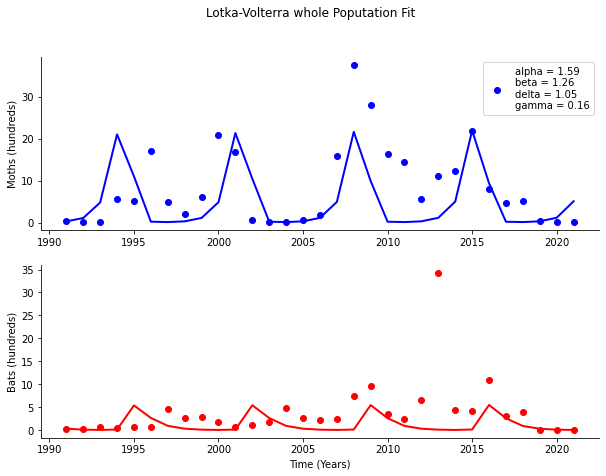

In [ ]:
lv.plot_time_series(years, moths_pop, bats_pop,
                    prey_name='Moths', predator_name='Bats')

Phase Portrait of True #Bats vs. #Moths

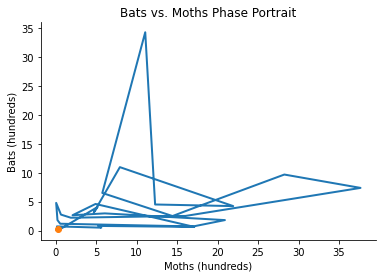

In [ ]:
lv.plot_phase_portrait(true_moths, true_bats)

Phase Portrait of Predicted #Bats vs. Moths

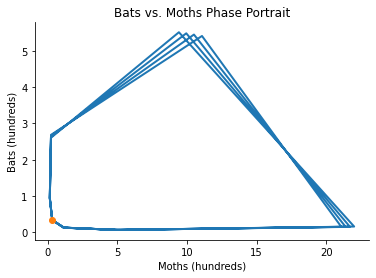

In [ ]:
lv.plot_phase_portrait(pred_moths, pred_bats)

#### ***5.2 Predict next 10 years for each cluster*** <a name="population_clusters"></a>

Using the parameters we got after fitting our data (total number of moths and bats, since 1991), we will now predict the evolution of the populations in each cluster, to update each cluster' score.

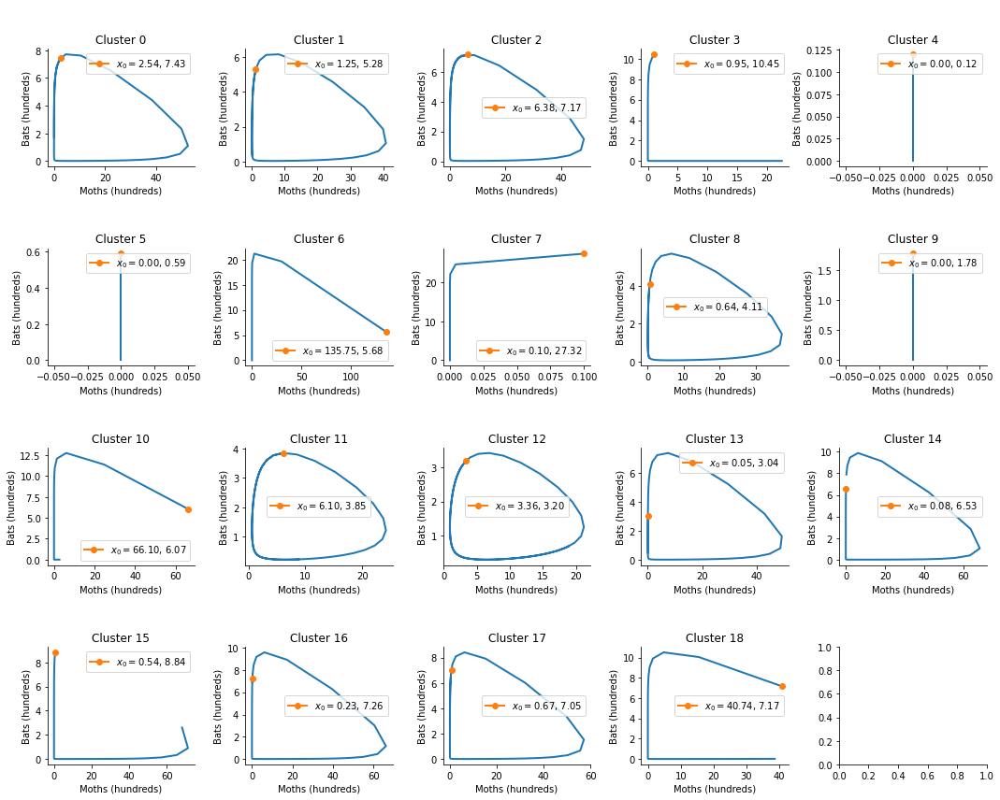

In [ ]:
# Subplots:
rows = 4
cols = 5
size_each = 3

fig, axes = plt.subplots(rows, cols,figsize =(cols*size_each, rows*size_each) )

counter = 0

for r in range(rows):
  for c in range(cols):
    if counter == 19:
      break
    cluster = gpd_centroids.index[counter]
    mb = gpd_centroids.iloc[counter]
    X0 = [mb.n_moths/100, mb.quantity/100]

    # We predict for 10 years, with 1000 points in total
    years = np.linspace(0, 10, 100)

    Xs = lv.predict(X0, years)

    axes[r][c].plot(Xs[:,0], Xs[:,1], "-")
    axes[r][c].plot(X0[0], X0[1], '-o', label="$x_0 = $" + f"{X0[0]:.2f}, {X0[1]:.2f}")
    axes[r][c].set_title(f'\n\nCluster {cluster}')
    axes[r][c].set_xlabel("Moths (hundreds)")
    axes[r][c].set_ylabel("Bats (hundreds)")
    axes[r][c].legend()
    counter += 1

plt.tight_layout()

In [ ]:
def animate_func(num):

    counter = 0

    for r in range(rows):
      for c in range(cols):
        if counter == 19:
          break
        axes[r][c].clear()        

        cluster = gpd_centroids.index[counter]
        mb = gpd_centroids.iloc[counter]
        X0 = [mb.n_moths/100, mb.quantity/100]

        # We predict for 10 years, with 100 points in total
        years = np.linspace(0, 10, 100)

        Xs = lv.predict(X0, years)

        axes[r][c].plot(Xs[:num+1, 0], Xs[:num+1,1], "-", color='tab:blue', label=f"Year {1 + int(num/10)}" )
        axes[r][c].plot(Xs[num, 0], Xs[num, 1],  marker='o', color='darkorange', alpha=1)
        axes[r][c].set_title(f'Cluster {cluster}')

        axes[r][c].set_xlim([-np.min(Xs[:,0])/5, np.max(Xs[:,0]) + np.max(Xs[:,0])/10])
        axes[r][c].set_ylim([-np.min(Xs[:,0])/5, np.max(Xs[:,1]) + np.max(Xs[:,1])/10])

        counter += 1

rows = 4
cols = 5
size_each = 2

fig, axes = plt.subplots(rows, cols,figsize =(cols*size_each, rows*size_each), dpi=100)
plt.suptitle(t='Bats vs. Moths\n')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
line_ani = animation.FuncAnimation(fig, animate_func, interval=75, frames=100)
plt.close()
HTML(line_ani.to_html5_video())

#### ***5.3 Create new cluster's importance for the next 10 years*** <a name="score_10_years"></a>

In [ ]:
moths_cluster = pd.DataFrame(data=gpd_centroids.n_moths, index=gpd_centroids.index).rename(columns={'n_moths': 0})
bats_cluster = pd.DataFrame(data=gpd_centroids.quantity, index=gpd_centroids.index).rename(columns={'quantity': 0})

In [ ]:
gpd_centroids.to_csv("10y/cluster_importance_y0.csv")
new_centroids = gpd_centroids.copy()

for i in range(9):
  moth_pred = gpd_centroids.apply(lambda row: 100 * lv.predict([row.n_moths/100, row.quantity/100], years)[i+1][0], axis=1)
  bat_pred = gpd_centroids.apply(lambda row: 100 * lv.predict([row.n_moths/100, row.quantity/100], years)[i+1][1], axis=1)

  new_centroids.quantity = bat_pred
  new_centroids.n_moths = moth_pred

  norm_fts = MinMaxScaler().fit_transform(new_centroids[['quantity', 'important_behaviour', 'density', 'protected_weight', 'proportion_last_5_years', 'proportion_young', 'n_moths']])
  new_centroids['importance'] = MinMaxScaler().fit_transform(norm_fts.sum(axis=-1).reshape(-1, 1))

  new_centroids.to_csv(f"10y/cluster_importance_y{i+1}.csv")

#### ***5.4 Evolution of cluster's importance in the next 10 years*** <a name="evolution_10_years"></a>

In [ ]:
cluster_imps = pd.DataFrame(index=gpd_centroids.index)

for i in range(10):
  imp = pd.read_csv(f'10y/cluster_importance_y{i}.csv').importance
  cluster_imps[i] = imp

In [ ]:
def animate_func(num):

    ax.clear()
    ax.bar(cluster_imps[num].index, cluster_imps[num].values)  
    ax.set_title(f"Year {num}")
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Score")
    ax.set_xticks(list(range(len(cluster_imps))))

fig, ax = plt.subplots(1,1, figsize=(7,4), dpi=120)
line_ani = animation.FuncAnimation(fig, animate_func, interval=750, frames=10)
plt.close()
HTML(line_ani.to_html5_video())

#### ***5.5 Create final cluster's scores (10 years)*** <a name="score_10_years"></a>

In [ ]:
hexgrid_copy = hexgrid_final.drop(bat_features + human_features, axis=1).copy()
for i in range(10):
  imp = pd.read_csv(f'10y/cluster_importance_y{i}.csv').importance
  hexgrid_copy.cluster_score = hexgrid_copy.nearest_cluster.apply(lambda x: imp[int(x)])
  hexgrid_copy.to_csv(f'10y_hexgrid/y{i}.csv')

### ***6. Optimization for Light System with Dark Corridors*** <a name="light"></a>

#### ***6.1 Context and Rationale***

The first step was to gain deeper insights about the areas in Bristol where bats live, eat, mate, etc. to better understand the requirements for the dark corridors to create. These areas were discovered by using a clustering technique, so the dark corridors should connect the clusters in the best way possible.

To do that, it's important to weigh not only the relevance for bats but also the impact the corridors might have on people's lives. These factors were quantified through the scores calculated previously, for each zone.

Thus, now, the goal is to connect all clusters (more precisely, their centroids) by turning off lights in the zones with the optimal balance between bat and human scores. The optimization process has, then, 2 parts:

1. *A Minimum Cost Path Problem*: creating a network of the optimal dark corridors between all clusters with each other (e.g., 3 corridors between cluster A and B, A and C, B and C). The algorithm should find the best path of zones between clusters that minimize the total balanced "insatisfaction" score of bats and humans (i.e. the minimum cost path).

2. *A Minimum Spanning Tree Problem*: after identifying all possible corridors, the algorithm should find the corridors with the minimum balanced "insatisfaction" score that connects all clusters, but not necessarily between each other (e.g., a minimum spanning tree could be created with the corridors A - B and B - C, which includes a path from A to C but excludes the direct corridor A - C). This is done to ensure that bats can travel to all clusters, while keeping the amount of dark corridors to a minimum.

**Notes and Future Improvements:**
* For MVP purposes, the algorithm gives the same weight to both scores (50/50) but these weights can be adjusted easily with empirical values. Clusters can also be weighted differently according to the importance for the bats, and, for example, in zones near a more important cluster, the algorithm would give more weight to the bat score.
* Currently, the algorithm connects cluster centroids. However, with the importance of each cluster, it is possible to define different radius for a dark zone inside the cluster were it is the most suitable for bats, and connect those circular areas instead of the centroids.

#### ***6.2 Algorithm***

##### ***Dijkstra's Minimum Cost Path:***

With zone-based paths and having to minimize insatisfaction scores, one of the best tools to use is the Dijkstra's "miminum cost" algorithm. It is a graph-based tool, where nodes will represent zones and the leg costs (weights) will be the insatisfaction score of the destination zone.

Why Dijkstra?
* Has very little restrictions, which means it always works and finds the lowest cost path, as long as the costs are always positive and if the problem is set as a minimization problem.
* Easy to apply and computes paths very quickly (if the graphs are already created).

**Dijkstra's Setup**:

The trickiest part is to create the graphs correctly, and the basic rationale behind the algorithm was to create a cost matrix that has the costs (scores) of the adjacent zones (zones that touch, either by the sides or the vertices) for each zone:
* Score: the score from zone A to B is equal to the score of zone B (and vice-versa), to make sure there was no need to create negative costs on the graphs
* These matrixes take some time to compute but only need to be calculated when the scores are updated, and therefore can be saved and loaded quickly, allowing a very fast computation for regular use.

Afterwards, to create the graphs, the matrixes are iterated and the graphs are constructed with the saved information.

##### ***Minimum Spanning Tree:***

The minimum spanning tree is a also a graph-based combinatorial problem, but instead of finding the minimum cost path between nodes, it finds the least costly way to connect all intended nodes. In this case, the nodes are the zones with cluster centroids and the legs (weights) between them are the total scores of the minimum cost paths calculated through Dijkstra's algorithm. Here is an example of a minimum spanning tree:

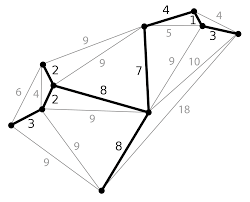

The process is:
* Create a sparse matrix representing the graph. Each cell represents a connection between 2 clusters, and the value is the score of the path between them. The matrix is only filled on the right side of the main diagonal (every other cell is filled with 0), so there is no repetition of paths (A - B and B - A).
* From that matrix, the minimum spanning tree is created also in matrix form and the final dark corridors are extracted from there.
* Finally, the zones of the dark corridors are crossed with the light positions, and all lights inside them are removed.

**Code**:

A LightManager class was built, allowing any manager object to be created with a dataframe that contains a zone ID, geometry and scores.
The object can build the model from scratch and create the cost matrixes, or load them. The final output is the updated .csv file of Bristol Lights with the lights to turn off signalled, and the plot of the new lighting system at night.

In [ ]:
class LightManager(object):
    def __init__(self, data, city_map, original_lights,
                 animal_importance=None, max_importance=0.8, prints=True):
        
        # city zone dataframe (includes zone, geometry, and scores) and map
        self.data = data

        # city map (for plotting purposes)
        self.city_map = city_map
        # original lighting system
        self.original_lights = original_lights
        
        # sum scores to minimize total
        if animal_importance != None:
            # if the user specifies a weight for the animal score, then the optimization will give the specified weight to all zones, independently from the max importance
            human_importance = 1 - animal_importance
            self.data['cost'] = animal_importance * self.data.animal_score + human_importance * self.data.human_score
        else:
            # max_importance is the maximum weight a factor can have for the optimization
            # if the user doesn't specify the weight, then it is calculated through the score of the cluster (which reflects its importance for the animals)
            # but first the cluster scores must be changed to be inside the max_importance
            self.data['animal_importance'] = self.data.cluster_score.apply(lambda x: max_importance if x > max_importance else x)
            min_importance = 1 - max_importance
            self.data.animal_importance = self.data.animal_importance.apply(lambda x: min_importance if x < min_importance else x)
            self.data['cost'] = self.data.animal_importance * self.data.animal_score + self.data.animal_importance.apply(lambda x: 1 - x) * self.data.human_score
        
        # Dijkstra node network graph for best score path algorithm
        self.graph = dj.Graph()
        
        # zone matrix with scores between adjacent zones (score from zones A to B equals the score of B, rest filled with NaN)
        self.cost_matrix = pd.DataFrame()
        
        # list with all calculated paths (according to Dijsktra's algorithm)
        self.paths = []
        
        # final dark corridors DataFrame (without unnecessary paths, according to Minimum Spanning Tree)
        self.dark_corridors = pd.DataFrame()
        
        # new lights
        self.new_lights = None
        
        # create centroids for each zone
        self.data['centroids'] = self.data['geometry'].centroid
        
        # create clusters dataframe and give each one an ID
        self.clusters = self.data[self.data.contains_cluster == 1]
        self.clusters = gpd.GeoDataFrame(self.clusters[['zone','contains_cluster', 'geometry', 'centroids']])
        self.clusters['cluster'] = list(string.ascii_uppercase)[:len(self.clusters)]
        self.clusters.reset_index(drop=True, inplace = True)
    
    def create_matrix(self):
        #######
        # Creates cost matrix
        #######
        
        cost_matrix = pd.DataFrame(self.data.zone)
        
        counter = 0
        total = len(cost_matrix)
        start = time()
        
        print('Creating Cost Matrix ....')
        for row in self.data.itertuples():
            zone = row.zone
            
            # Find zone neighbours
            neighbours = self.data[self.data.touches(row.geometry)]
            
            # Merge scores of neigbours with cost matrix (non-neigbours filled with NaN)
            temp_score = neighbours[['zone', 'cost']].rename(columns={'cost':zone})
            cost_matrix = cost_matrix.merge(temp_score, on='zone', how='left')

            end = time()
            current = round((end-start)/60, 2)
            counter += 1
            print (f' {counter} of {total} | {current} of estimated {round(current/counter * total, 2)} min ...', end='\r')

        # update class properties
        self.cost_matrix = cost_matrix.copy()
        
        return cost_matrix
    
    def create_graphs(self):
        #######
        # Creates Dijsktra's graph from cost matrix
        #######
        
        # Check if matrixes are set
        if self.cost_matrix.empty:
            raise ValueError("Cost Matrix is empty. Create Matrix first!")
 
        print('Creating graphs ....', end='\r')
        
        # Create auxiliary DataFrames for each matrix/graph
        aux = self.cost_matrix.copy()
  
        # Get nodes/zones from any cost matrix
        nodes = aux.drop(columns=['zone'])
        nodes = nodes.columns.to_list()
        
        # Iterate over nodes, type of cost_matrixes and the matrix itself (while dropping non-neighbours)
        counter = 0
        total = len(nodes)
        # For each zone
        for zone in nodes:
            # Drop non-neighbours of current zone
            temp = pd.DataFrame(aux[zone].dropna())
            # For each neighbour add leg between current zone and neighbour  
            for neighbour, cost in temp.itertuples():
                self.graph.add_edge(int(zone), int(neighbour), cost)
            counter += 1
            print(f'Created {counter} of {total} nodes', end='\r')
        
        print('Graphs created successfully!')
        
    def find_path(self, start_zone, end_zone, ID, prints=True):
        #######
        # Finds best path according to Dijsktra's algorithm
        #######
        if prints:
            print('Finding path ....', end='\r')
        
        path = {'path': [], 'score': 0, 'ID' : ID}
    
        # Find path
        try:
            path['path'] = dj.find_path(self.graph, start_zone, end_zone).nodes
        except:
            if prints:
                print(f'Unable to find path between zones {start_zone} and {end_zone}')           
            else:
                pass
 
        # Calculate distances, average and maximum danger scores for each path
        total_score = self.data[self.data.zone.isin(path['path'])].cost.sum()
        path['score'] = round(total_score,2)
        
        self.paths.append(path)

        return path
    
    def find_cluster_paths(self, plots = True):
        #######
        # Finds all paths between every cluster
        #######

        cl_1 = 0
        while cl_1 < len(self.clusters) - 1:
            zone_1 = self.clusters.at[cl_1, 'zone']
            cluster_1 = self.clusters.at[cl_1, 'cluster']
            cl_2 = cl_1 + 1
            while cl_2 < len(self.clusters):
                zone_2 = self.clusters.at[cl_2, 'zone']
                cluster_2 = self.clusters.at[cl_2, 'cluster']
                self.find_path(zone_1, zone_2, f'{cluster_1}{cluster_2}')
                cl_2 += 1
            cl_1 += 1
            
        if plots:
            # Plot all paths
            self.plot()

        return pd.DataFrame(self.paths)
    
    def create_dark_corridors(self):
        #######
        # Finds only the necessary paths according to Minimum Spanning Tree
        #######
        
        # Create paths dataframe
        paths = pd.DataFrame(self.paths)
        aux = paths.ID.apply(lambda x: pd.Series(list(x)))
        paths['1'] = aux[0]  # start cluster
        paths['2'] = aux[1]  # end cluster
        
        matrix_n = len(self.clusters)
        matrix  = []
        column = 1
        for cl in self.clusters.itertuples():
            row = []
            # fill row with 0 for lower diagonal
            column_counter = 0
            while column_counter < column:
                row.append(0)
                column_counter += 1

            aux = paths[paths['1'] == cl.cluster]
            for score in aux.itertuples():
                row.append(score.score)

            matrix.append(row)
            column += 1

        X = csr_matrix(matrix)
        Tcsr = minimum_spanning_tree(X)
        tree = Tcsr.toarray()
        tree.astype(int)
        
        # final paths
        row = 0
        IDs = []
        while row < len(tree):
            column = 0
            while column < len(tree[row]):
                if tree[row][column] > 0:
                    IDs.append(paths[(paths['1']== self.clusters.at[row, 'cluster']) & (paths['2']== self.clusters.at[column, 'cluster'])].reset_index().at[0, 'ID'])
                column += 1
            row += 1

        self.dark_corridors = paths[paths.ID.isin(IDs)]  
        self.dark_corridors.reset_index(drop=True, inplace=True)

        return self.dark_corridors
    
    def update_lighting(self, plots=True):
        #######
        # Updates the lighting system by keeping only the lights that should be kept on
        #######

        streetlights_2022 = self.original_lights
        streetlights_2022.rename(columns = {'Unnamed: 0': 'ID'}, inplace = True)
        
        no_light_zones = []
        for row in self.dark_corridors.itertuples():
            no_light_zones += row.path
        no_light_zones = list(np.unique(no_light_zones))

        turnoff_zones = self.data[self.data.zone.isin(no_light_zones)]

        turnoff_lights = []
        counter = 1
        total = len(turnoff_zones)
        for zone in turnoff_zones.itertuples():
            temp = gpd.GeoSeries(streetlights_2022.geometry)
            temp = pd.DataFrame(temp.within(zone.geometry))
            temp = temp[temp[0] == True]
            turnoff_lights += list(temp.index)
            print(f'{counter} of {total}', end='\r')
            counter += 1

        self.new_lights = streetlights_2022[~streetlights_2022.ID.isin(turnoff_lights)]
        self.new_lights = gpd.GeoDataFrame(self.new_lights, crs='EPSG:27700')
        
        if plots:
            # plot lighting
            fig, axs = plt.subplots(1, 2, figsize=(15, 15), sharex=True)

            # Original Lighting
            self.city_map.plot(color='#0A0E42', ax=axs[0])
            streetlights_2022_gdf.plot(markersize=0.5, ax=axs[0], color='gold', alpha=0.5)
            axs[0].set_axis_off()
            axs[0].title.set_text('Original Lighting')

            # Dark Corridors
            self.city_map.plot(color='#0A0E42', ax=axs[1])
            self.new_lights.plot(markersize=0.5, ax=axs[1], color='gold', alpha=0.5)
            axs[1].set_axis_off()
            axs[1].title.set_text('Lighting with Dark Corridors')

            # Cluster zones
            self.clusters.centroids.plot(ax=axs[1], color='red', markersize=40, label='Bat Clusters Centers')
            axs[1].legend(loc="upper right")
        
        return self.new_lights
    
    def plot(self):
        #######
        # Plots all calculated paths
        #######
        
        # Reset route type in dataframe
        try:
            self.data.drop(inplace=True, columns={'route_type'})
        except:
            pass
        
        # Create route type in dataframe
        for path in self.paths:
            self.data.loc[self.data.zone.isin(path['path']), 'route_type'] = f"Path {path['ID']} | Score: {path['score']}"
        
        # Plot
        fig, ax = plt.subplots()
        self.data.plot(ax=ax, color='white', edgecolor='black')
        self.data.plot(column='route_type', ax=ax, legend=True, legend_kwds={'bbox_to_anchor': (1.2, 1)})
        ax.set_axis_off()

    def save(self, filename='cost_matrix.csv'):
        #######
        # Saves cost matrix as .csv
        #######

        print('Saving file',end='\r')
        self.cost_matrix.to_csv(filename)

        print('Saved files successfully!')
        
    def load(self, filename='cost_matrix.csv'):
        #######
        # Loads main cost matrixes (distance) from .csv
        #######
        
        try:
            print(f'Loading file', end='\r')
            self.cost_matrix = pd.read_csv(filename)
            self.cost_matrix.drop(inplace=True, columns=['Unnamed: 0'])
            print('Loaded file successfully!')
            
            self.create_graphs()
        
        except:
            print('Unable to load files! Confirm file existence.')
    
    def build(self):
        #######
        # Builds object from scratch without loading information
        #######
        self.create_matrix()
        self.save()


### ***7. Light Management System in Action*** <a name="action"></a>

In [ ]:
optimization_df = pd.read_csv('10y_hexgrid/y0.csv')
optimization_df.rename(columns = {'Unnamed: 0': 'zone'}, inplace = True)
optimization_df.geometry = gpd.GeoSeries.from_wkt(optimization_df.geometry)
optimization_df = gpd.GeoDataFrame(optimization_df, geometry='geometry')

In [ ]:
# Create system optimizer object
manager = LightManager(optimization_df, bristol_map, streetlights_2022)
manager.data.head()

,zone,geometry,animal_score,human_score,contains_cluster,nearest_cluster,cluster_score,animal_importance,cost,centroids
0,0,"POLYGON ((358824.801 166757.150, 358892.323 16...",0.431430,0.404022,0.0,8.0,0.704293,0.704293,0.423326,POINT (358872.136 166715.548)
1,1,"POLYGON ((358689.756 166715.270, 358700.791 16...",0.423726,0.415097,0.0,8.0,0.704293,0.704293,0.421174,POINT (358754.526 166745.315)
2,2,"POLYGON ((359027.365 166819.968, 359016.331 16...",0.419424,0.415868,0.0,8.0,0.704293,0.704293,0.418372,POINT (358959.844 166799.028)
3,3,"POLYGON ((358903.357 166850.274, 358892.323 16...",0.410673,0.428776,0.0,8.0,0.704293,0.704293,0.416026,POINT (358835.835 166829.335)
4,4,"POLYGON ((358779.348 166880.580, 358768.313 16...",0.403375,0.439156,0.0,8.0,0.704293,0.704293,0.413955,POINT (358711.825 166859.641)


In [ ]:
# This step is only required when the scores are updated...
# manager.build()

# ...otherwise, load support files
manager.load('cost_matrixes/cost_matrix_y0.csv')

Loaded file successfully!
Graphs created successfully!


Here we can see a plot depicting all possible paths, according to Dijkstra, and the final plot with only the necessary paths that connect high bat activity places, according to Minimum Spanning Tree. A DataFrame with only the lights that should be kept on is also returned:

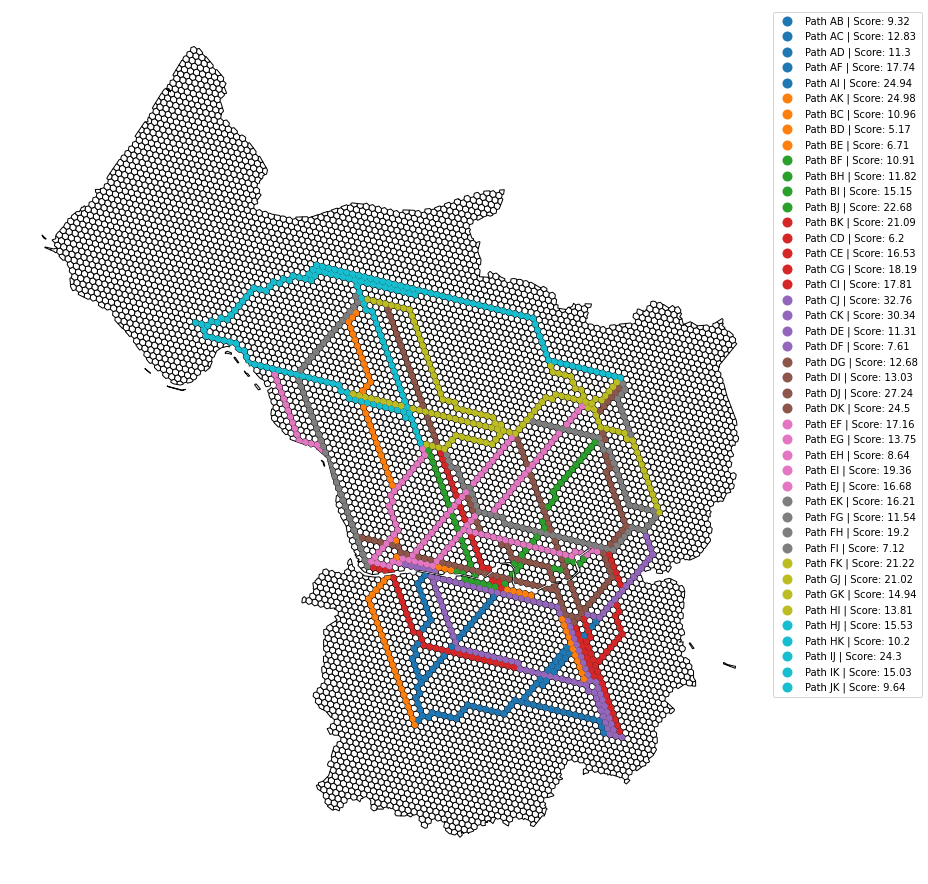

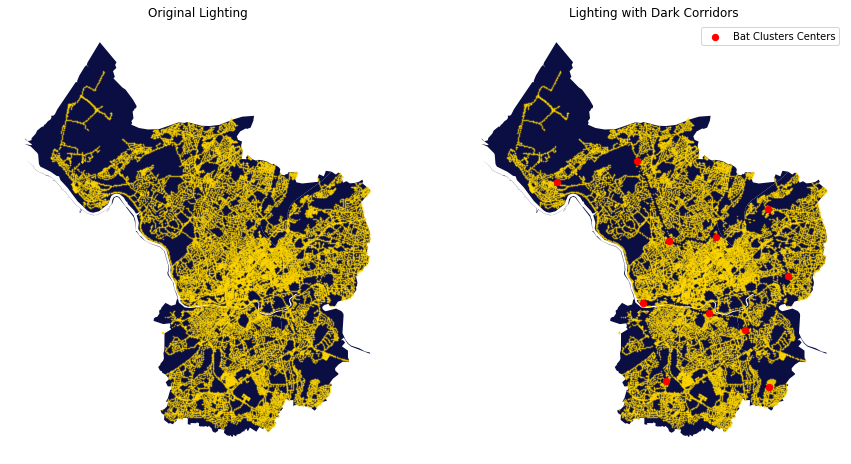

In [ ]:
all_paths = manager.find_cluster_paths()
dark_corridors = manager.create_dark_corridors()
new_lights = manager.update_lighting()

***Varying Corridors According to Season (historical) and Years (prediction):***

In [ ]:
# Create all cost matrixes
datasets = ['y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'Fall', 'Spring', 'Summer', 'Winter']

counter = 0
for dataset in datasets:
    optimization_df = pd.read_csv(f'{dataset}.csv')
    optimization_df.rename(columns = {'Unnamed: 0': 'zone'}, inplace = True)
    optimization_df.geometry = gpd.GeoSeries.from_wkt(optimization_df.geometry)
    optimization_df = gpd.GeoDataFrame(optimization_df, geometry='geometry')
    manager = LightManager(optimization_df)
    manager.create_matrix()
    manager.save(filename=f'cost_matrixes/cost_matrix_{dataset}.csv')
    counter += 1
    print(f'Matrix {counter} saved!')

In [ ]:
years = ['y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9']

for year in years:
    optimization_df = pd.read_csv(f'10y_hexgrid/{year}.csv')
    optimization_df.rename(columns = {'Unnamed: 0': 'zone'}, inplace = True)
    optimization_df.geometry = gpd.GeoSeries.from_wkt(optimization_df.geometry)
    optimization_df = gpd.GeoDataFrame(optimization_df, geometry='geometry')
    manager = LightManager(optimization_df, bristol_map, streetlights_2022)
    manager.load(filename=f'cost_matrixes/cost_matrix_{year}.csv')
    manager.find_cluster_paths(plots = False)
    manager.create_dark_corridors()
    lights = manager.update_lighting(plots = False)
    lights.to_csv(f'optimal_lighting/{year}.csv')
    manager.clusters.to_csv(f'optimal_lighting/allYear_clusters.csv')

In [ ]:
seasons = ['Fall', 'Spring', 'Summer', 'Winter']

for season in seasons:
    optimization_df = pd.read_csv(f'seasonal_hexgrid/{season}.csv')
    optimization_df.rename(columns = {'Unnamed: 0': 'zone'}, inplace = True)
    optimization_df.geometry = gpd.GeoSeries.from_wkt(optimization_df.geometry)
    optimization_df = gpd.GeoDataFrame(optimization_df, geometry='geometry')
    manager = LightManager(optimization_df, bristol_map, streetlights_2022)
    manager.load(filename=f'cost_matrixes/cost_matrix_{season}.csv')
    manager.find_cluster_paths(plots = False)
    manager.create_dark_corridors()
    lights = manager.update_lighting(plots = False)
    lights.to_csv(f'optimal_lighting/{season}.csv')
    manager.clusters.to_csv(f'optimal_lighting/{season}_clusters.csv')

***Lighting System:***

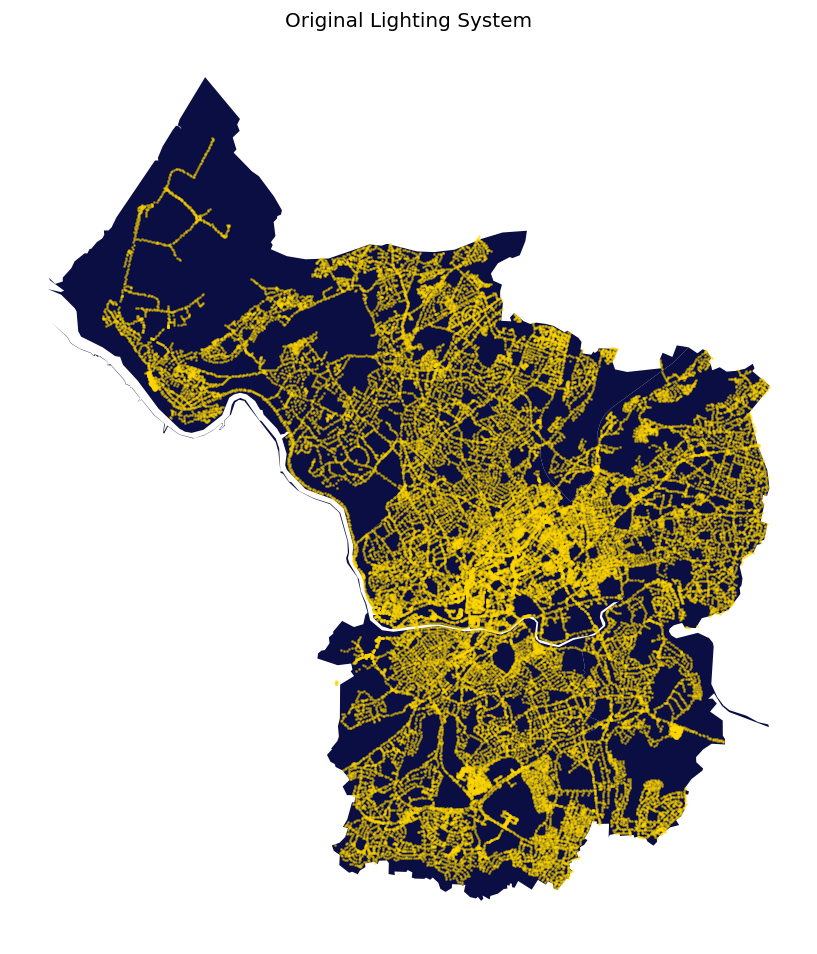

In [ ]:
# Read Seasonal Datasets
seasons = ['Original', 'Fall','Spring', 'Summer', 'Winter']
light_dfs = []
cluster_dfs = []

for season in seasons:
    lights = pd.read_csv(f'optimal_lighting/{season}.csv')
    lights.geometry = gpd.GeoSeries.from_wkt(lights.geometry)
    lights = gpd.GeoDataFrame(lights, geometry='geometry')
    clusters = gpd.GeoDataFrame()
    if season != 'Original':
        clusters = pd.read_csv(f'optimal_lighting/{season}_clusters.csv')
        clusters.geometry = gpd.GeoSeries.from_wkt(clusters.geometry)
        clusters = gpd.GeoDataFrame(clusters, geometry='geometry')
    light_dfs.append(lights)
    cluster_dfs.append(clusters)
    
def animate_func(num):

    ax.clear()
    
    # Dark Corridors
    ax.set_title(f'{seasons[num]} Lighting System')
    bristol_map.plot(color='#0A0E42', ax=ax)
    light_dfs[num].plot(markersize=0.5, ax=ax, color='gold', alpha=0.5)
    cluster_dfs[num].plot(ax=ax, color='red', markersize=40)
    ax.set_axis_off()

fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=120)
line_ani = animation.FuncAnimation(fig, animate_func, interval=1000, frames=5)
HTML(line_ani.to_html5_video())

In [ ]:
# Read Yearly Datasets
years = ['Original', 'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9']
light_dfs = []
for year in years:
    lights = pd.read_csv(f'optimal_lighting/{year}.csv')
    lights.geometry = gpd.GeoSeries.from_wkt(lights.geometry)
    lights = gpd.GeoDataFrame(lights, geometry='geometry')
    light_dfs.append(lights)

clusters = pd.read_csv(f'optimal_lighting/allYear_clusters.csv')
clusters.geometry = gpd.GeoSeries.from_wkt(clusters.geometry)
clusters = gpd.GeoDataFrame(clusters, geometry='geometry')

def animate_func(num):

    ax.clear()
    
    # Dark Corridors
    ax.set_title(f'{years[num]} Lighting System', fontdict = {'fontsize': 30})
    bristol_map.plot(color='#0A0E42', ax=ax)
    light_dfs[num].plot(markersize=0.5, ax=ax, color='gold', alpha=0.5)
    clusters.plot(ax=ax, color='red', markersize = 40)
    ax.set_axis_off()

fig, ax = plt.subplots(1,1, figsize=(10,10), dpi=120)
line_ani = animation.FuncAnimation(fig, animate_func, interval=1000, frames=11)
HTML(line_ani.to_html5_video())

### ***8. Impact Estimation*** <a name="impact"></a>

#### ***8.1 Electricity Savings***

***Cost Savings:***
According to [this](https://shropshire.gov.uk/street-care-and-cleaning/streetlights/facts-figures-and-faqs/street-lighting-facts/), "in simple terms, the electricity consumed by an 'average' light will cost between £25 and £65 a year." Using the most conservative estimations of £25, then the light cost per season is 25/4 = £6.25.

In [ ]:
seasons = ['Fall','Spring', 'Summer', 'Winter']
lights_df = pd.read_csv('streetlights_2022.csv')
lights = len(pd.read_csv('streetlights_2022.csv'))
turned_off_lights = 0
for season in seasons:
    turned_off_lights += (lights - len(pd.read_csv(f'optimal_lighting/{season}.csv')))
total_savings = turned_off_lights * 6.25
print(f'Total Electricity Savings: £{total_savings}')

Total Electricity Savings: £24818.75


***Environmental Impact:*** According to [this](https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/1032260/UK_Energy_in_Brief_2021.pdf):
* 76.7% of 2020 eletricity derived from unsustainable sources: Coal (3.4%), Gas (41.9%) and Oil (31.2%).

According to [this](https://www.eia.gov/tools/faqs/faq.php?id=74&t=11), each of these types of energy sources create the following CO<sub>2</sub> emissions per kWh:
* Coal: 1.012 kg
* Gas: 0.412 kg
* Oil: 0.966 kg

Considering that street lights are 100W lights and run on average 3940h per year, they consume 394 kWh. 

In [ ]:
lights_df = lights_df[lights_df.Burn_Hours != 'Not Specified'] 
lights_df.Burn_Hours = lights_df.Burn_Hours.astype(int)
lights_df.Burn_Hours.mean()

3939.9084627667294

In [ ]:
avg_light_power = 100
avg_seasonal_comsumption_per_light = lights_df.Burn_Hours.mean()/ 4 * avg_light_power / 1000

CO2 = {'CO2' : {'Coal' : 1.1012, 'Gas': 0.412, 'Oil' : 0.966},
      'Perc' : {'CO2' : 0.034, 'Gas': 0.419, 'Oil' : 0.312}}
CO2 = pd.DataFrame(CO2)

CO2['avg_emission_per_kWh'] = CO2.CO2 * CO2.Perc
avg_emission_per_kWh = CO2.avg_emission_per_kWh.sum()

saved_CO2 = turned_off_lights * avg_emission_per_kWh * avg_seasonal_comsumption_per_light
print(f'Total CO2 Savings: {round(saved_CO2)} kg')

Total CO2 Savings: 185406 kg


#### ***8.2 Increase in Bat Activity***

According to [this](https://www.sciencedirect.com/science/article/pii/S2351989421001980), Horseshoe bat (*Rhinolophus*) activity is negatively impacted by the presence of light by a factor of 4 (*R. Hipposideros*).

Considering that:
1. The activity increases by the same factor when the lights are turned off (x4)
2. Current activity can be estimated through the number of sightings per zone
3. Activity growth can be estimated with sightings/zone * 4 * number of turned off zones

Then we can expect the following increase in bat activity:

In [ ]:
bat_records_per_season = pd.read_csv('seasons_plot.csv')
bat_records_per_season['zone_activity_avg'] = bat_records_per_season.quantity/ len(optimization_df)

total_current_activity = bat_records_per_season.quantity.sum()
n_zones_off = []
for season in list(bat_records_per_season.season):
    dark_corridors = pd.read_csv(f'optimal_lighting/{season}_dark_corridors.csv')
    no_light_zones = []
    for row in dark_corridors.itertuples():
        no_light_zones = no_light_zones + ast.literal_eval(row.path)
    no_light_zones = np.array(no_light_zones)
    no_light_zones = np.unique(no_light_zones)
    n_zones_off.append(len(no_light_zones))
    
total_zones = len(optimization_df)
increase_factor = 4
bat_records_per_season['n_zones_off'] = n_zones_off
bat_records_per_season['new_activity'] = ((total_zones - bat_records_per_season.n_zones_off) + (bat_records_per_season.n_zones_off * increase_factor)) * bat_records_per_season.zone_activity_avg
bat_records_per_season

,season,quantity,zone_activity_avg,n_zones_off,new_activity
0,Fall,1462,0.185769,285,1620.832274
1,Spring,1212,0.154003,144,1278.529098
2,Summer,7461,0.948030,295,8300.006989
3,Winter,471,0.059848,151,498.110928


In [ ]:
activity_increase = (bat_records_per_season.new_activity.sum() - bat_records_per_season.quantity.sum())/ bat_records_per_season.quantity.sum() * 100
print(f'Estimated Bat Activity Increase: {round(activity_increase)} %')

Estimated Bat Activity Increase: 10 %
